# Temperature Analytics
## Day of Year Analysis and Residual Modeling

Similar to load analytics, we model temperature patterns:
- Seasonal patterns (day of year)
- Trend fitting
- Residual analysis
- Volatility clustering
- Extreme value analysis

In [1]:
import sys
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
from scipy.stats import genextreme, genpareto, pareto
from scipy.optimize import minimize

from wxderivs import SET_TARGET_US_CITIES, MONTH_CDD, MONTH_HDD, DIR_WORK

# Import seasonal modeling functions
from seasonal_models import (
    fit_seasonal_model,
    fit_seasonal_garch_model,
    compare_models,
    fit_all_regions,
    plot_model_comparison,
    plot_aic_bic_comparison,
    # Diagnostic functions
    plot_fitted_model_and_residuals,
    plot_residual_distribution,
    plot_autocorrelation,
    analyze_volatility_clustering,
    run_full_diagnostics
)

# Set plotting style
sns.set_style('whitegrid')
plt.rcParams['figure.figsize'] = (12, 6)
plt.rcParams['font.size'] = 10

sys.path.append(str(DIR_WORK / "unibm"))

import unibm
import unibm.benchmark

0 /workspaces/Financial-Engineering-Project/notebooks/wxderivs/../../data/raw/temperature/Essen.csv
1 /workspaces/Financial-Engineering-Project/notebooks/wxderivs/../../data/raw/temperature/Boston.csv
2 /workspaces/Financial-Engineering-Project/notebooks/wxderivs/../../data/raw/temperature/Philadelphia.csv
3 /workspaces/Financial-Engineering-Project/notebooks/wxderivs/../../data/raw/temperature/NewYork.csv
4 /workspaces/Financial-Engineering-Project/notebooks/wxderivs/../../data/raw/temperature/Burbank.csv
5 /workspaces/Financial-Engineering-Project/notebooks/wxderivs/../../data/raw/temperature/London.csv
6 /workspaces/Financial-Engineering-Project/notebooks/wxderivs/../../data/raw/temperature/Dallas.csv
7 /workspaces/Financial-Engineering-Project/notebooks/wxderivs/../../data/raw/temperature/Paris.csv
8 /workspaces/Financial-Engineering-Project/notebooks/wxderivs/../../data/raw/temperature/Portland.csv
9 /workspaces/Financial-Engineering-Project/notebooks/wxderivs/../../data/raw/tempe

In [2]:
# Reload the seasonal_models module to get the latest changes
import importlib
import seasonal_models
importlib.reload(seasonal_models)

# Re-import the functions after reload
from seasonal_models import (
    fit_seasonal_model,
    fit_seasonal_garch_model,
    compare_models,
    fit_all_regions,
    plot_model_comparison,
    plot_aic_bic_comparison,
    # Diagnostic functions
    plot_fitted_model_and_residuals,
    plot_residual_distribution,
    plot_autocorrelation,
    analyze_volatility_clustering,
    run_full_diagnostics
)

print("✓ seasonal_models module reloaded successfully!")

✓ seasonal_models module reloaded successfully!


## Load Data

Load processed temperature data from multiple regions

In [3]:
# Load Boston temperature data
df_boston = pd.read_csv('../data/processed/temperature/Boston.csv')
df_boston['date'] = pd.to_datetime(df_boston['date'])
df_boston = df_boston[(df_boston['date'] >= '2014-01-01') & (df_boston['date'] <= '2022-12-31')]
df_boston.set_index('date', inplace=True)

# Load New York temperature data
df_ny = pd.read_csv('../data/processed/temperature/NewYork.csv')
df_ny['date'] = pd.to_datetime(df_ny['date'])
df_ny = df_ny[(df_ny['date'] >= '2014-01-01') & (df_ny['date'] <= '2022-12-31')]
df_ny.set_index('date', inplace=True)

# Load Chicago temperature data
df_chicago = pd.read_csv('../data/processed/temperature/Chicago.csv')
df_chicago['date'] = pd.to_datetime(df_chicago['date'])
df_chicago = df_chicago[(df_chicago['date'] <= '2022-12-31') & (df_chicago['date'] >= '2014-01-01')]
df_chicago.set_index('date', inplace=True)

# Load Minneapolis temperature data
df_minneapolis = pd.read_csv('../data/processed/temperature/Minneapolis.csv')
df_minneapolis['date'] = pd.to_datetime(df_minneapolis['date'])
df_minneapolis = df_minneapolis[(df_minneapolis['date'] >= '2014-01-01') & (df_minneapolis['date'] <= '2022-12-31')]
df_minneapolis.set_index('date', inplace=True)

# Load Houston temperature data
df_houston = pd.read_csv('../data/processed/temperature/Houston.csv')
df_houston['date'] = pd.to_datetime(df_houston['date'])
df_houston = df_houston[(df_houston['date'] >= '2014-01-01') & (df_houston['date'] <= '2022-12-31')]
df_houston.set_index('date', inplace=True)

# Load Dallas temperature data
df_dallas = pd.read_csv('../data/processed/temperature/Dallas.csv')
df_dallas['date'] = pd.to_datetime(df_dallas['date'])
df_dallas = df_dallas[(df_dallas['date'] >= '2014-01-01') & (df_dallas['date'] <= '2022-12-31')]
df_dallas.set_index('date', inplace=True)

print("Boston data shape:", df_boston.shape)
print("New York data shape:", df_ny.shape)
print("Chicago data shape:", df_chicago.shape)
print("Minneapolis data shape:", df_minneapolis.shape)
print("Houston data shape:", df_houston.shape)
print("Dallas data shape:", df_dallas.shape)
print("\nBoston columns:", df_boston.columns.tolist())
print("\nBoston data range:", df_boston.index.min(), "to", df_boston.index.max())

Boston data shape: (3287, 3)
New York data shape: (3287, 3)
Chicago data shape: (3287, 3)
Minneapolis data shape: (3287, 3)
Houston data shape: (3287, 3)
Dallas data shape: (3287, 3)

Boston columns: ['tmin', 'tmax', 'tavg']

Boston data range: 2014-01-01 00:00:00 to 2022-12-31 00:00:00


In [4]:
# Preview data
df_boston.head(10)

,tmin,tmax,tavg
date,,,
2014-01-01,19.0,29.0,24.0
2014-01-02,2.0,26.0,14.0
2014-01-03,2.0,14.0,8.0
2014-01-04,2.0,27.0,14.5
2014-01-05,24.0,38.0,31.0
2014-01-06,29.0,56.0,42.5
2014-01-07,9.0,29.0,19.0
2014-01-08,7.0,22.0,14.5
2014-01-09,19.0,30.0,24.5


## Plotting Functions

Define functions to plot day-of-year patterns and residuals

In [5]:
def plot_day_of_year(
    srs,
    is_day_of_year_frac=False,
    is_scatter=False,
    alpha=0.7,
    is_label=False,
    xlabel="Day of year",
    ylabel="Temperature (°F)",
    title="Temperature vs Day of year",
    axhline=None,
    axvline_red=None,
    axvline_blue=None,
    ax=None,
):
    """Plot time series against day of year, colored by year."""
    if is_day_of_year_frac:
        vec_t = (srs.index.day_of_year / (srs.index.is_leap_year + 365)).to_numpy()
    else:
        vec_t = srs.index.day_of_year.to_numpy()
    vec_y = srs.to_numpy()
    year_unique = srs.index.year.unique()
    cmap = plt.get_cmap("rainbow", len(year_unique))
    color_map = {year: cmap(i) for i, year in enumerate(year_unique)}
    if ax is None:
        fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 6))
    for year in year_unique:
        idx = srs.index.year == year
        if is_scatter:
            ax.scatter(
                vec_t[idx],
                vec_y[idx],
                s=3,
                color=color_map[year],
                alpha=alpha,
                label=year if is_label else None,
            )
        else:
            ax.plot(
                vec_t[idx],
                vec_y[idx],
                label=year if is_label else None,
                alpha=alpha,
                lw=1.5,
                c=color_map[year],
                linestyle="-",
            )
    if axhline:
        for val in axhline:
            ax.axhline(val, color="black", linestyle="--", lw=0.9)
    if axvline_red:
        for val in axvline_red:
            ax.axvline(val, color="red", linestyle="--", lw=0.9)
    if axvline_blue:
        for val in axvline_blue:
            ax.axvline(val, color="blue", linestyle="--", lw=0.9)
    ax.grid(True, alpha=0.3)
    if is_label:
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    return ax

## Day of Year Patterns

Visualize how temperature varies by day of year across multiple years

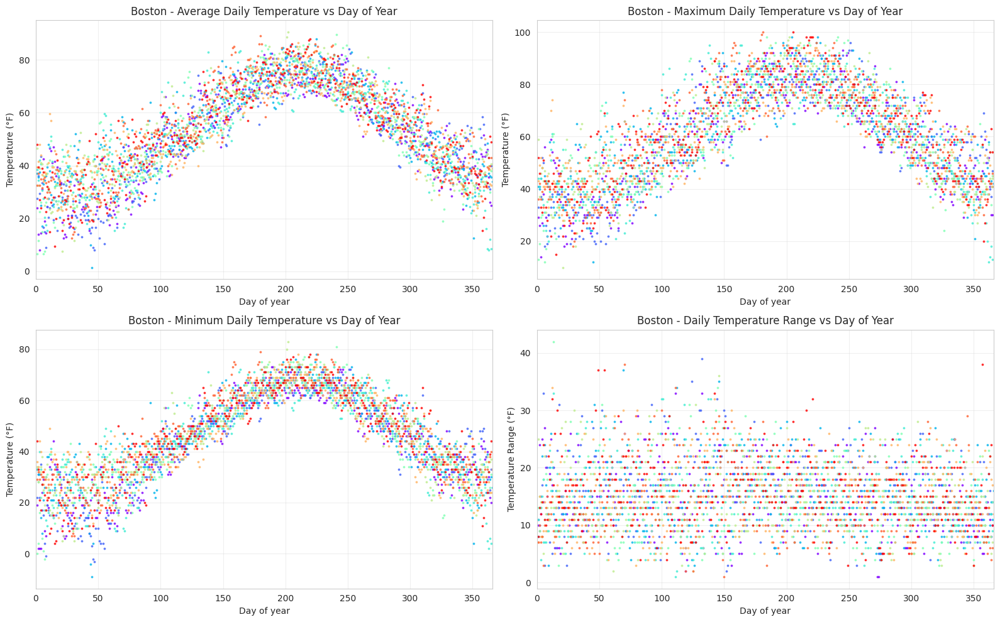

In [6]:
# Plot temperature patterns for Boston
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 10))

plot_day_of_year(
    df_boston['tavg'],
    is_scatter=True,
    title="Boston - Average Daily Temperature vs Day of Year",
    ylabel="Temperature (°F)",
    ax=axes[0, 0],
)

plot_day_of_year(
    df_boston['tmax'],
    is_scatter=True,
    title="Boston - Maximum Daily Temperature vs Day of Year",
    ylabel="Temperature (°F)",
    ax=axes[0, 1],
)

plot_day_of_year(
    df_boston['tmin'],
    is_scatter=True,
    title="Boston - Minimum Daily Temperature vs Day of Year",
    ylabel="Temperature (°F)",
    ax=axes[1, 0],
)

# Plot temperature range (max - min)
temp_range = df_boston['tmax'] - df_boston['tmin']
plot_day_of_year(
    temp_range,
    is_scatter=True,
    title="Boston - Daily Temperature Range vs Day of Year",
    ylabel="Temperature Range (°F)",
    ax=axes[1, 1],
)

for ax in axes.flatten():
    ax.set_xlim(0, 366)

plt.tight_layout()
plt.savefig('../data/images/temp_boston_day_of_year_patterns.png', dpi=150, bbox_inches='tight')
plt.show()

## Day of Year Patterns - New York

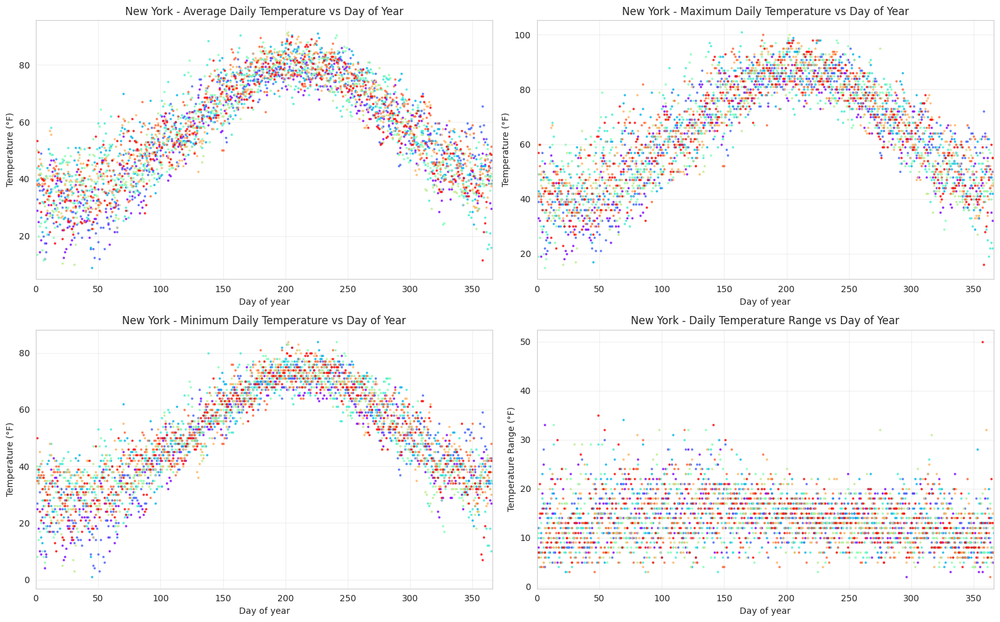

In [7]:
# Plot temperature patterns for New York
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 10))

plot_day_of_year(
    df_ny['tavg'],
    is_scatter=True,
    title="New York - Average Daily Temperature vs Day of Year",
    ylabel="Temperature (°F)",
    ax=axes[0, 0],
)

plot_day_of_year(
    df_ny['tmax'],
    is_scatter=True,
    title="New York - Maximum Daily Temperature vs Day of Year",
    ylabel="Temperature (°F)",
    ax=axes[0, 1],
)

plot_day_of_year(
    df_ny['tmin'],
    is_scatter=True,
    title="New York - Minimum Daily Temperature vs Day of Year",
    ylabel="Temperature (°F)",
    ax=axes[1, 0],
)

# Plot temperature range (max - min)
temp_range_ny = df_ny['tmax'] - df_ny['tmin']
plot_day_of_year(
    temp_range_ny,
    is_scatter=True,
    title="New York - Daily Temperature Range vs Day of Year",
    ylabel="Temperature Range (°F)",
    ax=axes[1, 1],
)

for ax in axes.flatten():
    ax.set_xlim(0, 366)

plt.tight_layout()
plt.savefig('../data/images/temp_ny_day_of_year_patterns.png', dpi=150, bbox_inches='tight')
plt.show()

## All Regions Comparison - Day of Year Patterns

Side-by-side comparison of average temperature patterns for all regions

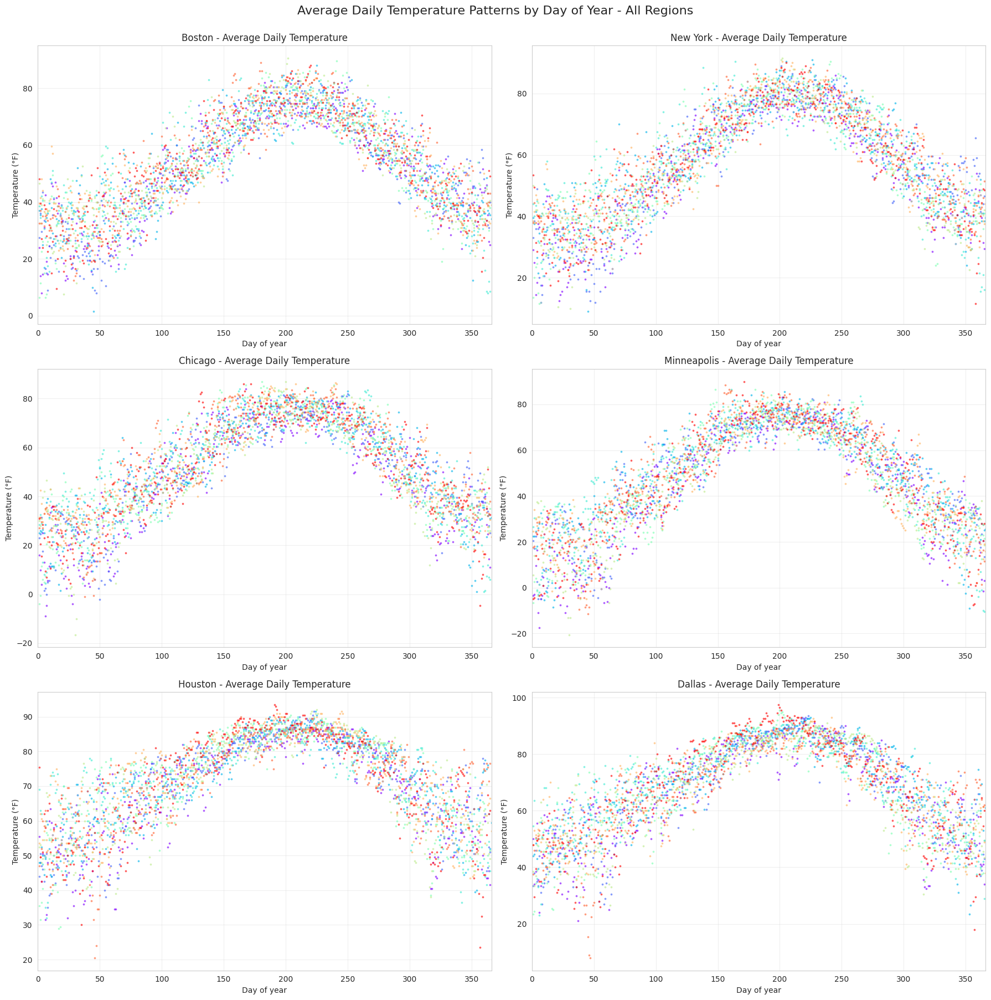

In [8]:
# Create a 3x2 grid comparing all 6 regions
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(18, 18))

# Boston
plot_day_of_year(
    df_boston['tavg'],
    is_scatter=True,
    title="Boston - Average Daily Temperature",
    ylabel="Temperature (°F)",
    alpha=0.5,
    ax=axes[0, 0],
)

# New York
plot_day_of_year(
    df_ny['tavg'],
    is_scatter=True,
    title="New York - Average Daily Temperature",
    ylabel="Temperature (°F)",
    alpha=0.5,
    ax=axes[0, 1],
)

# Chicago
plot_day_of_year(
    df_chicago['tavg'],
    is_scatter=True,
    title="Chicago - Average Daily Temperature",
    ylabel="Temperature (°F)",
    alpha=0.5,
    ax=axes[1, 0],
)

# Minneapolis
plot_day_of_year(
    df_minneapolis['tavg'],
    is_scatter=True,
    title="Minneapolis - Average Daily Temperature",
    ylabel="Temperature (°F)",
    alpha=0.5,
    ax=axes[1, 1],
)

# Houston
plot_day_of_year(
    df_houston['tavg'],
    is_scatter=True,
    title="Houston - Average Daily Temperature",
    ylabel="Temperature (°F)",
    alpha=0.5,
    ax=axes[2, 0],
)

# Dallas
plot_day_of_year(
    df_dallas['tavg'],
    is_scatter=True,
    title="Dallas - Average Daily Temperature",
    ylabel="Temperature (°F)",
    alpha=0.5,
    ax=axes[2, 1],
)

for ax in axes.flatten():
    ax.set_xlim(0, 366)

plt.suptitle('Average Daily Temperature Patterns by Day of Year - All Regions', fontsize=16, y=1.00)
plt.tight_layout()
plt.savefig('../data/images/temp_all_regions_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

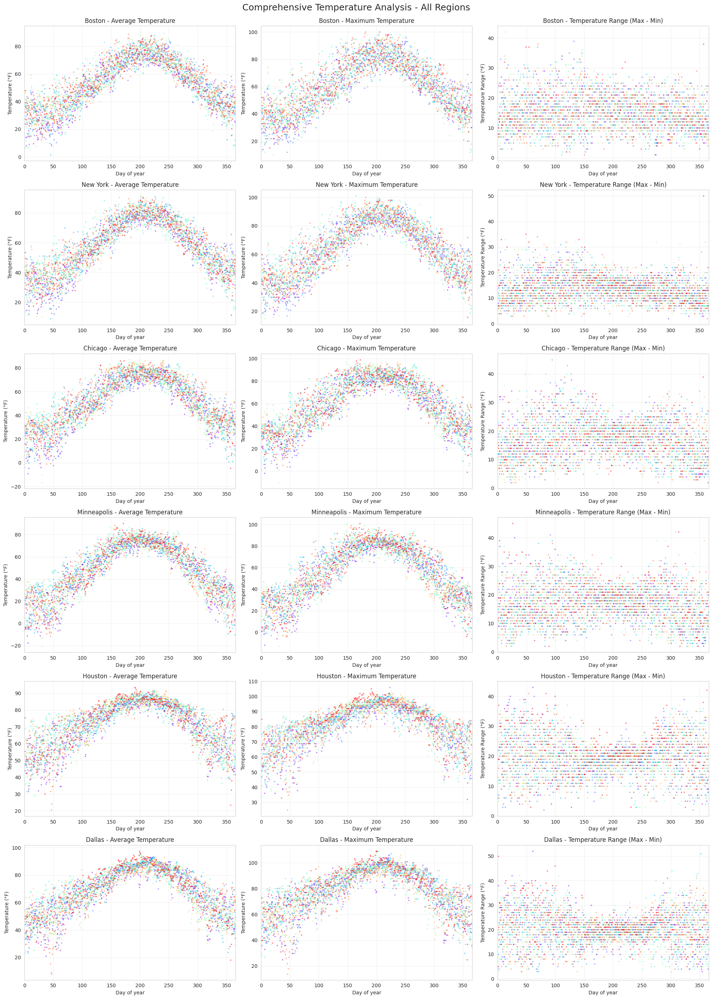

In [9]:
# Comprehensive comparison: Max, Min, and Range for all 6 regions
fig, axes = plt.subplots(nrows=6, ncols=3, figsize=(20, 28))

regions_data = {
    'Boston': df_boston,
    'New York': df_ny,
    'Chicago': df_chicago,
    'Minneapolis': df_minneapolis,
    'Houston': df_houston,
    'Dallas': df_dallas,
}

for i, (region_name, df_region) in enumerate(regions_data.items()):
    # Average Temperature
    plot_day_of_year(
        df_region['tavg'],
        is_scatter=True,
        title=f"{region_name} - Average Temperature",
        ylabel="Temperature (°F)",
        alpha=0.4,
        ax=axes[i, 0],
    )
    
    # Max Temperature
    plot_day_of_year(
        df_region['tmax'],
        is_scatter=True,
        title=f"{region_name} - Maximum Temperature",
        ylabel="Temperature (°F)",
        alpha=0.4,
        ax=axes[i, 1],
    )
    
    # Temperature Range
    temp_range = df_region['tmax'] - df_region['tmin']
    plot_day_of_year(
        temp_range,
        is_scatter=True,
        title=f"{region_name} - Temperature Range (Max - Min)",
        ylabel="Temperature Range (°F)",
        alpha=0.4,
        ax=axes[i, 2],
    )

# Set x-axis limits for all subplots
for ax in axes.flatten():
    ax.set_xlim(0, 366)

plt.suptitle('Comprehensive Temperature Analysis - All Regions', fontsize=18, y=0.995)
plt.tight_layout()
plt.savefig('../data/images/temp_comprehensive_all_regions.png', dpi=150, bbox_inches='tight')
plt.show()

## Compare Multiple Regions

Create a dictionary of all regions for modeling

In [10]:
regions = {
    'Boston': df_boston['tavg'],
    'NewYork': df_ny['tavg'],
    'Chicago': df_chicago['tavg'],
    'Minneapolis': df_minneapolis['tavg'],
    'Houston': df_houston['tavg'],
    'Dallas': df_dallas['tavg'],
}

## Seasonal Pattern Fitting

Fit sinusoidal + trend model to capture seasonal patterns

In [11]:
# Fit model for all regions
region_fit = {}

for city in regions.keys():
    region_fit[city] = fit_seasonal_model(regions[city], n_harmonics=3)
    print(f"{city} Model R²:", 1 - np.var(region_fit[city]['residuals']) / np.var(region_fit[city]['y']))
    print(f"{city} Residuals mean:", region_fit[city]['residuals'].mean())
    print(f"{city} Residuals std:", region_fit[city]['residuals'].std())

Boston Model R²: 0.8155329432341432
Boston Residuals mean: 7.666165981440886e-14
Boston Residuals std: 7.523896833207305
NewYork Model R²: 0.8336935835329992
NewYork Residuals mean: 7.408494262236128e-14
NewYork Residuals std: 7.183234241216182
Chicago Model R²: 0.8116728906469259
Chicago Residuals mean: 4.693429838400759e-14
Chicago Residuals std: 8.787349580077105
Minneapolis Model R²: 0.8350262644276589
Minneapolis Residuals mean: 5.86246394700758e-14
Minneapolis Residuals std: 9.358326073019109
Houston Model R²: 0.7279174635408319
Houston Residuals mean: 1.1282216752294234e-13
Houston Residuals std: 6.921487142574732
Dallas Model R²: 0.7678552408695604
Dallas Residuals mean: 1.245470954169575e-13
Dallas Residuals std: 7.740881657647598


## Visualize Fitted Model and Residuals

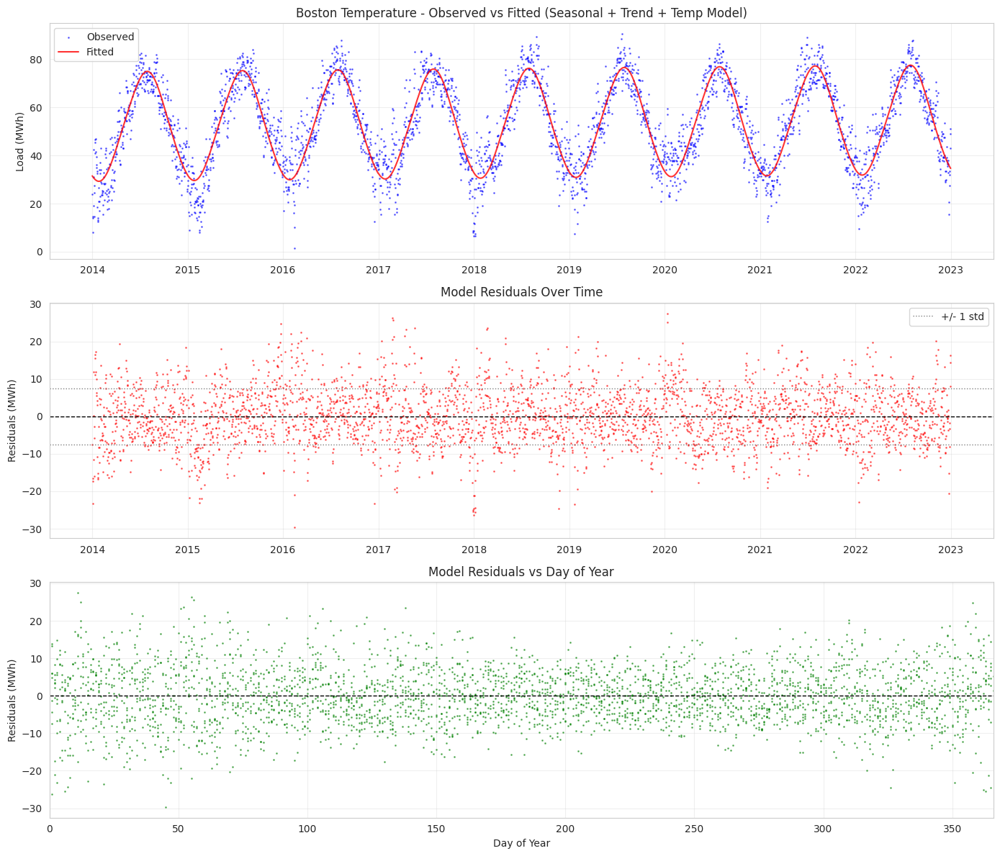

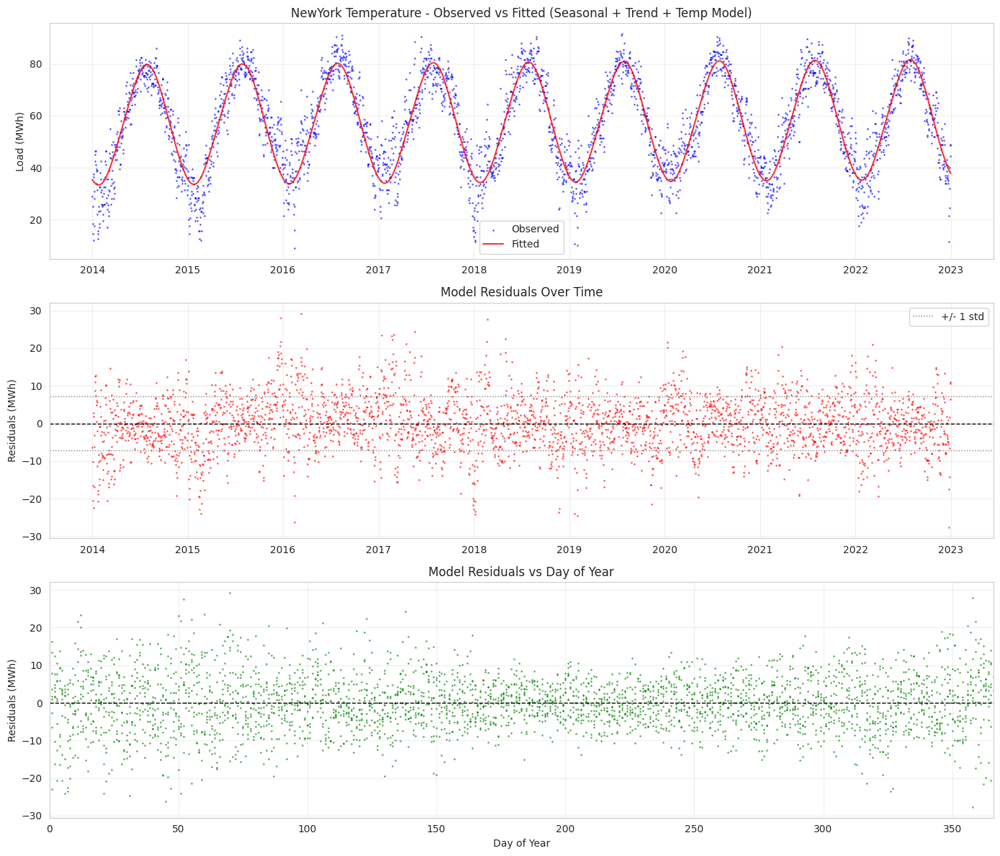

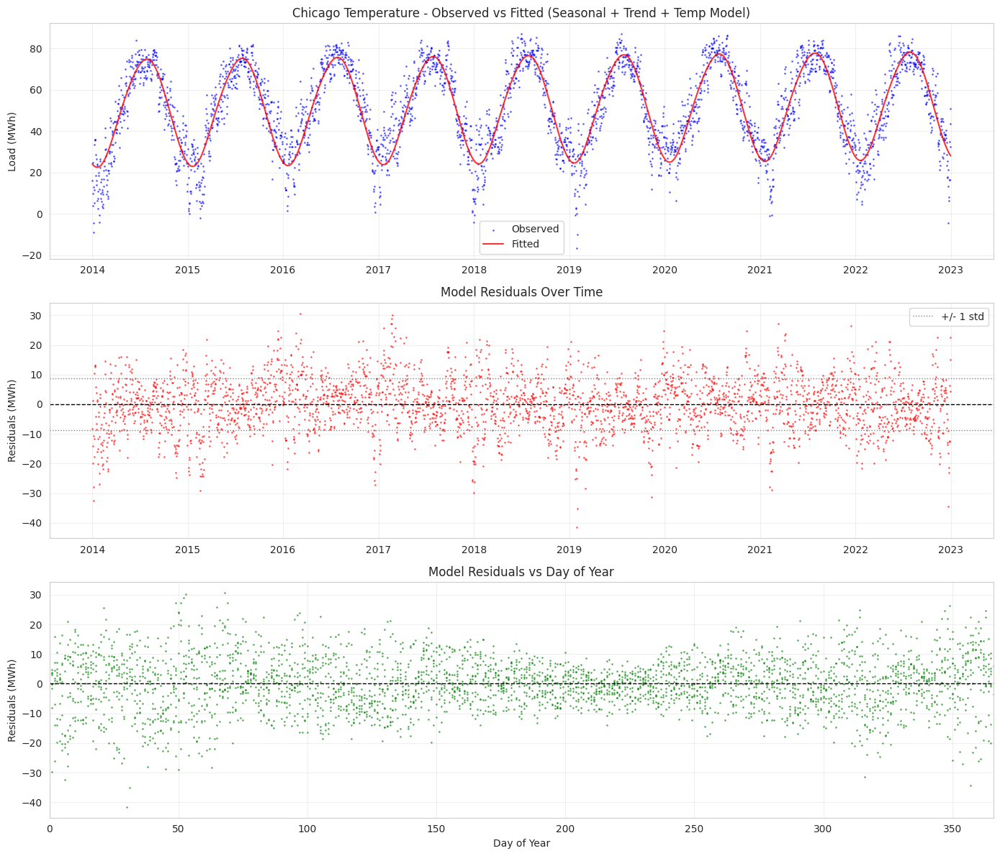

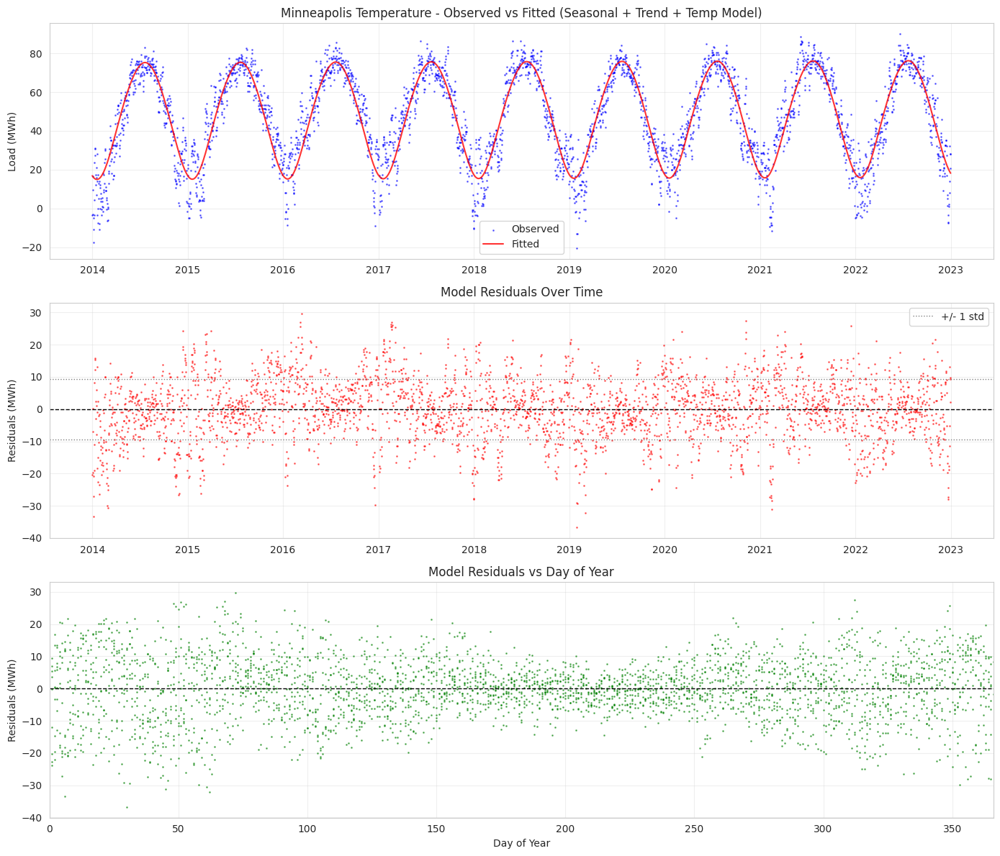

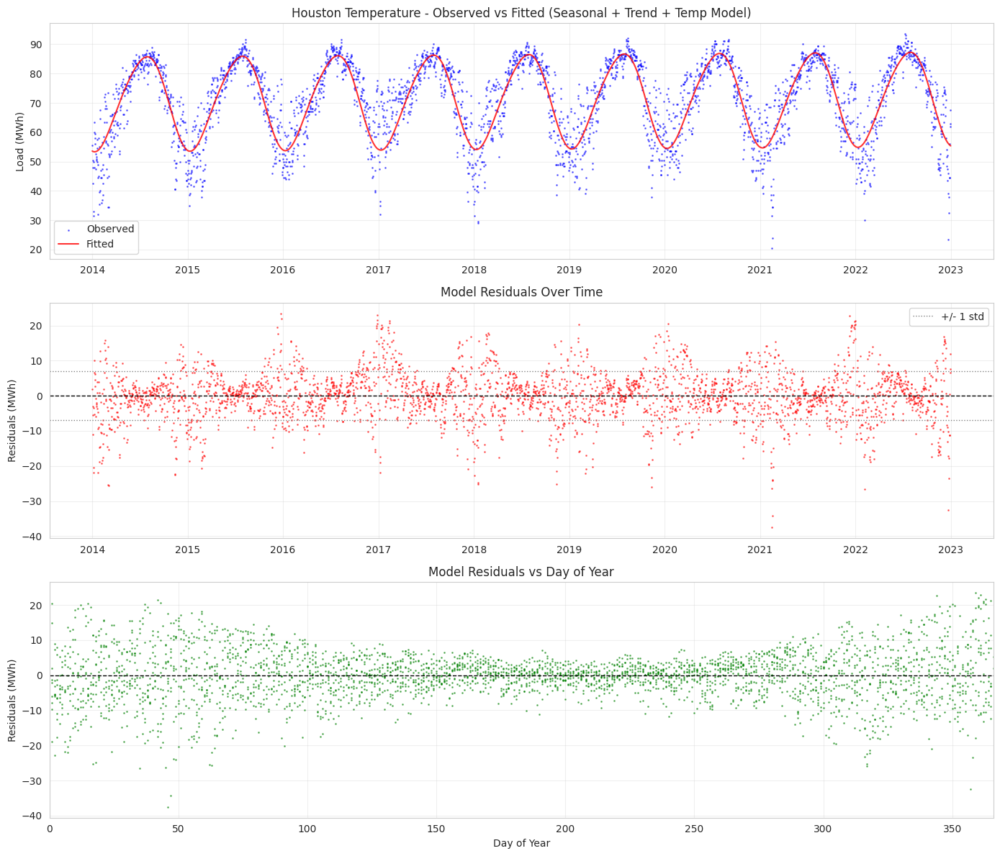

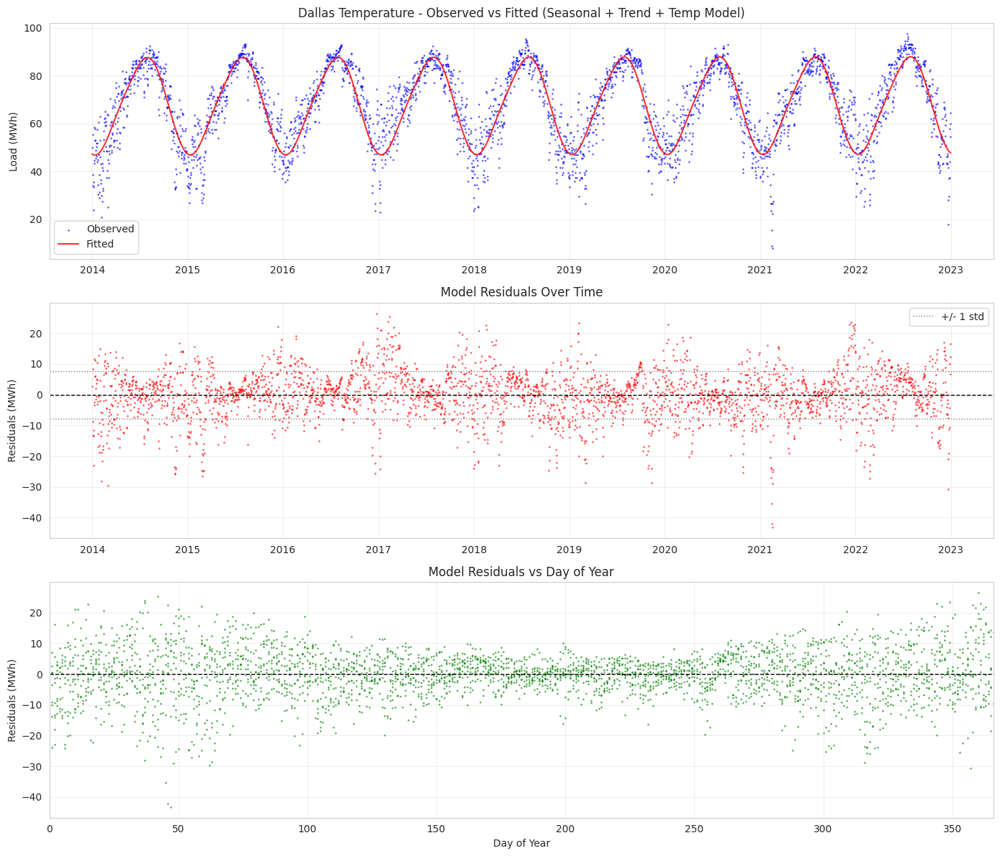

In [12]:
for city in regions.keys():
    # Visualize fitted model and residuals using helper function
    plot_fitted_model_and_residuals(
        region_fit[city], 
        city,
        save_path=f'../data/images/temp_model_fit_and_residuals_{city}.png',
        temperature=True
    )
    plt.show()

## Residual Distribution Analysis


Boston - RESIDUAL NORMALITY TEST
D'Agostino-Pearson test: statistic=18.6081, p-value=9.1053e-05
Reject normality (p < 0.05): True



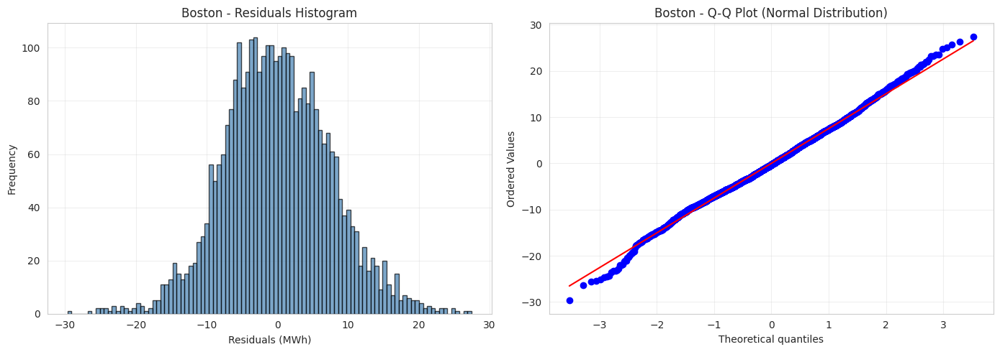


NewYork - RESIDUAL NORMALITY TEST
D'Agostino-Pearson test: statistic=29.9934, p-value=3.0692e-07
Reject normality (p < 0.05): True



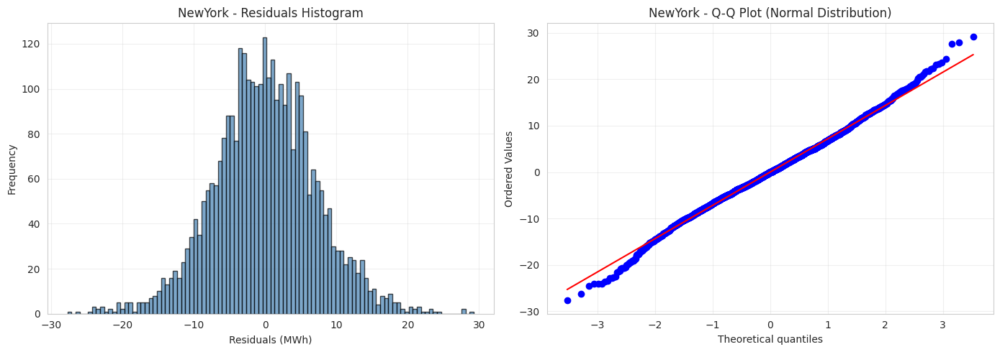


Chicago - RESIDUAL NORMALITY TEST
D'Agostino-Pearson test: statistic=42.4352, p-value=6.0997e-10
Reject normality (p < 0.05): True



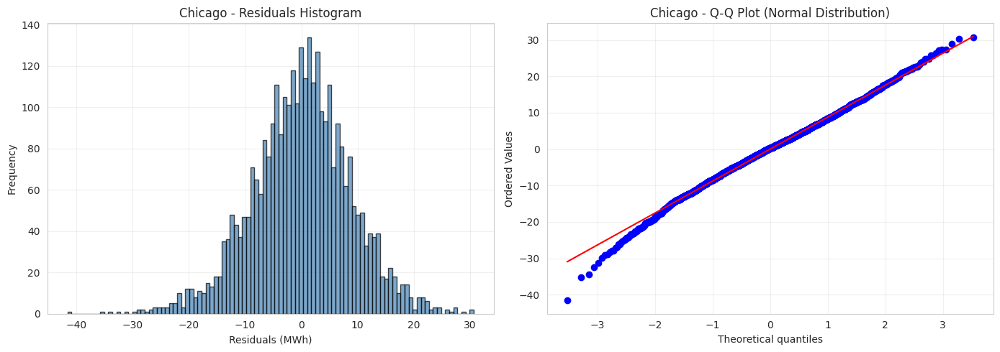


Minneapolis - RESIDUAL NORMALITY TEST
D'Agostino-Pearson test: statistic=36.3289, p-value=1.2921e-08
Reject normality (p < 0.05): True



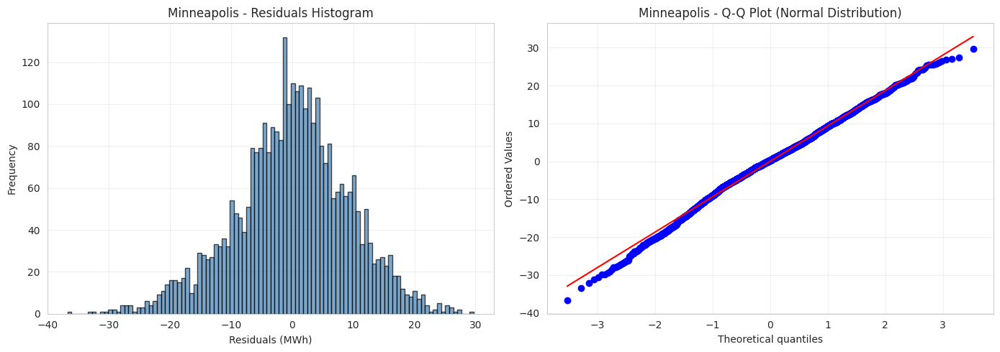


Houston - RESIDUAL NORMALITY TEST
D'Agostino-Pearson test: statistic=166.3915, p-value=7.3882e-37
Reject normality (p < 0.05): True



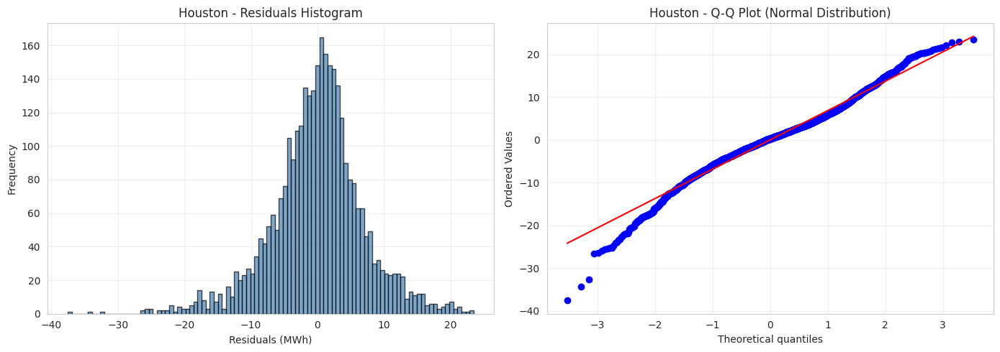


Dallas - RESIDUAL NORMALITY TEST
D'Agostino-Pearson test: statistic=235.2220, p-value=8.3597e-52
Reject normality (p < 0.05): True



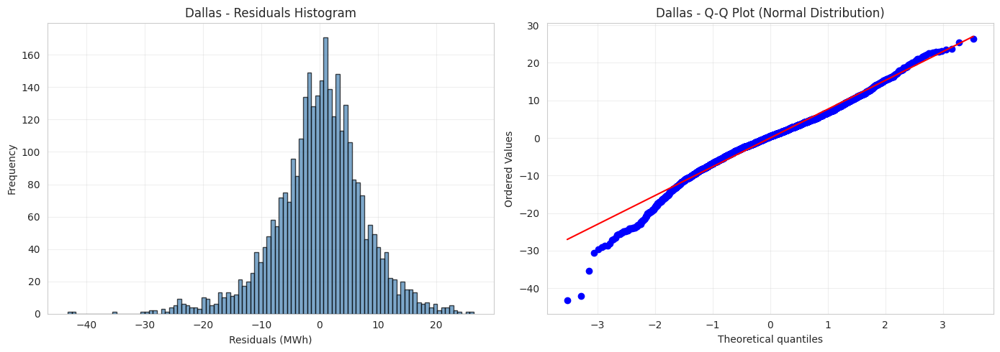

In [13]:
# Analyze residual distribution using helper function
for city in regions.keys():
    plot_residual_distribution(
        region_fit[city],
        city,
        save_path=f'../data/images/temp_residual_distribution_{city}.png'
    )
    plt.show()

## Autocorrelation Analysis

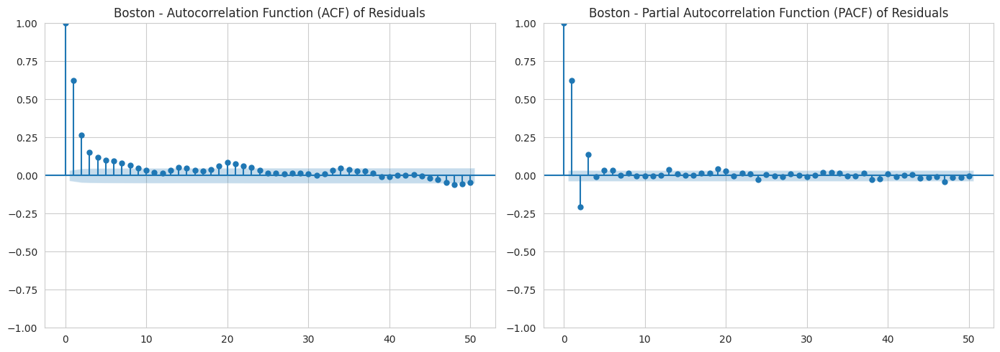

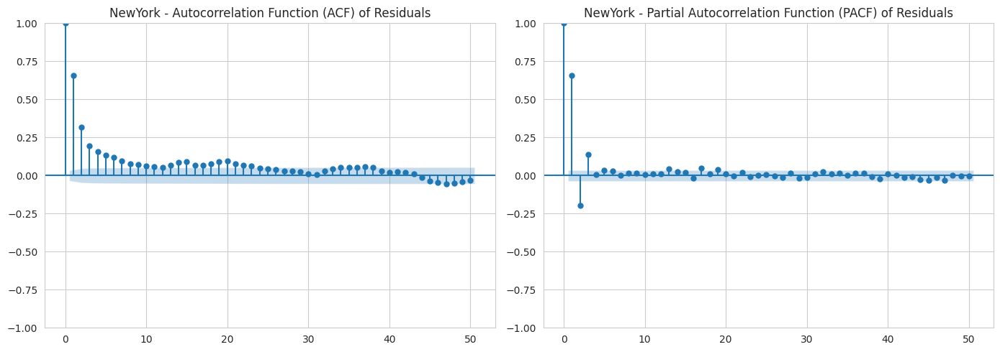

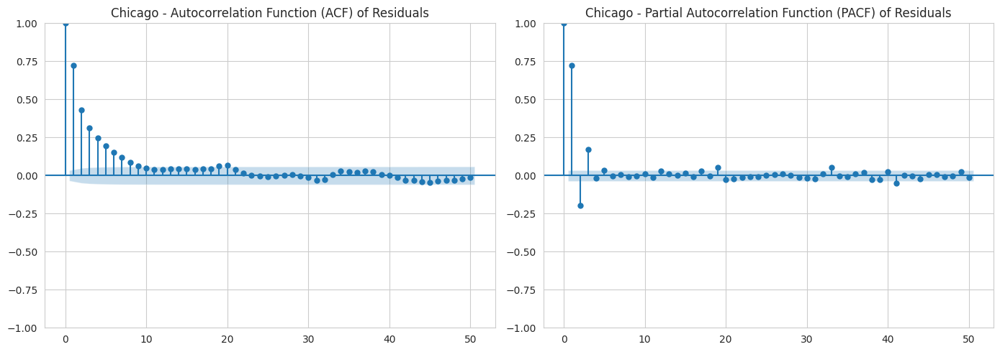

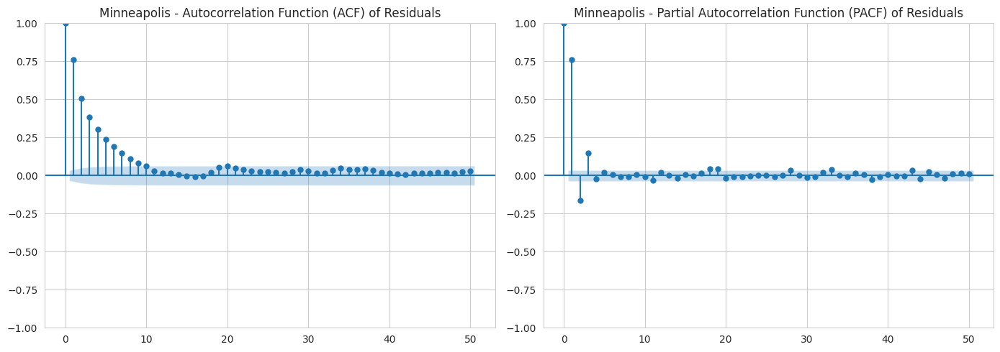

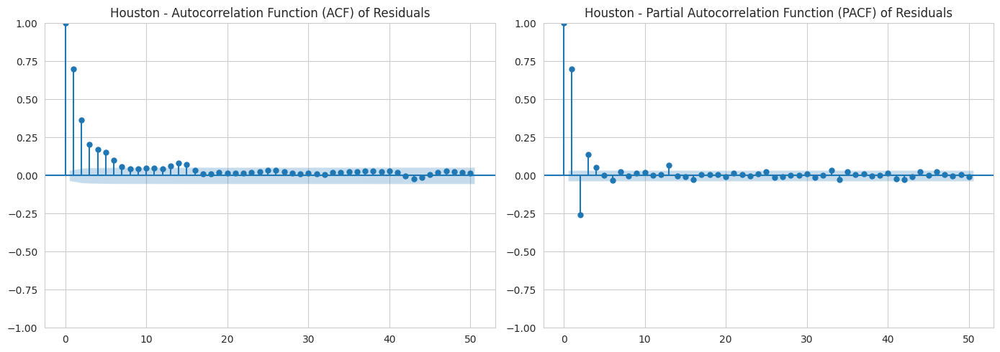

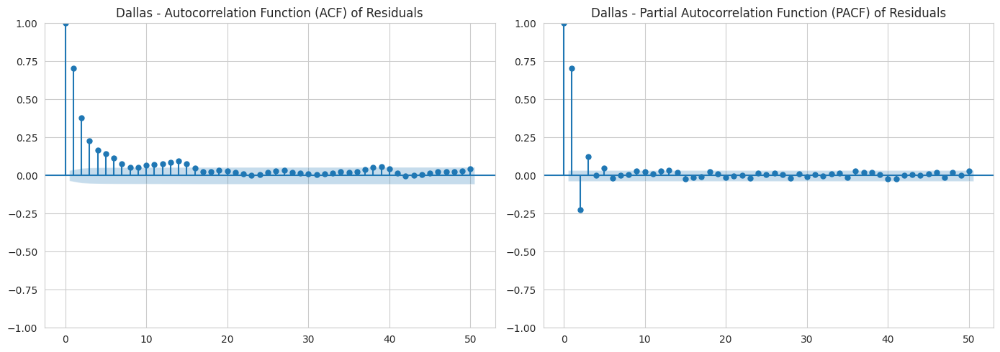

In [14]:
# Plot autocorrelation functions using helper function
for city in regions.keys():
    plot_autocorrelation(
        region_fit[city],
        city,
        lags=50,
        save_path=f'../data/images/temp_autocorrelation_{city}.png'
    )
    plt.show()

## Volatility Clustering Analysis

Check if residuals exhibit volatility clustering


Boston - LJUNG-BOX TEST (Test for ARCH Effects)
        lb_stat      lb_pvalue
1    659.888083  1.580057e-145
2    738.729723  3.862593e-161
3    795.239781  4.662404e-172
4    850.069112  1.094668e-182
5    893.175779  7.980424e-191
6    923.584626  2.991514e-196
7    949.107941  1.189203e-200
8    983.256258  6.138019e-207
9   1017.348387  3.129622e-213
10  1055.813756  1.763075e-220

If p-values < 0.05, reject null hypothesis of no autocorrelation
This indicates presence of ARCH effects (volatility clustering)

Number of significant lags (out of 20): 20
⚠️  Strong evidence of volatility clustering!

Boston - ARCH LM TEST (Engle's Test)

Lag 1:
  LM Statistic: 659.6768, p-value: 1.7564e-145
  F Statistic:  824.8712, p-value: 4.9366e-162
  ⚠️  Reject null hypothesis - ARCH effects present at lag 1

Lag 5:
  LM Statistic: 698.3152, p-value: 1.1364e-148
  F Statistic:  177.0867, p-value: 3.1990e-167
  ⚠️  Reject null hypothesis - ARCH effects present at lag 5

Lag 10:
  LM Statistic: 7

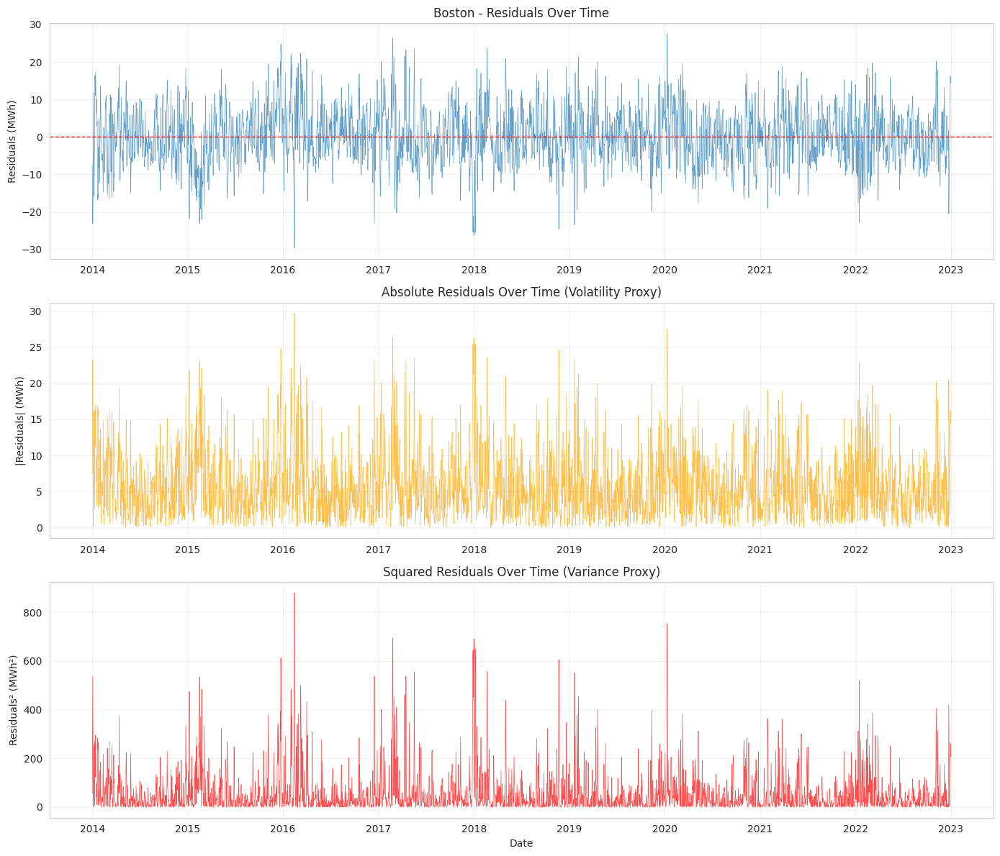

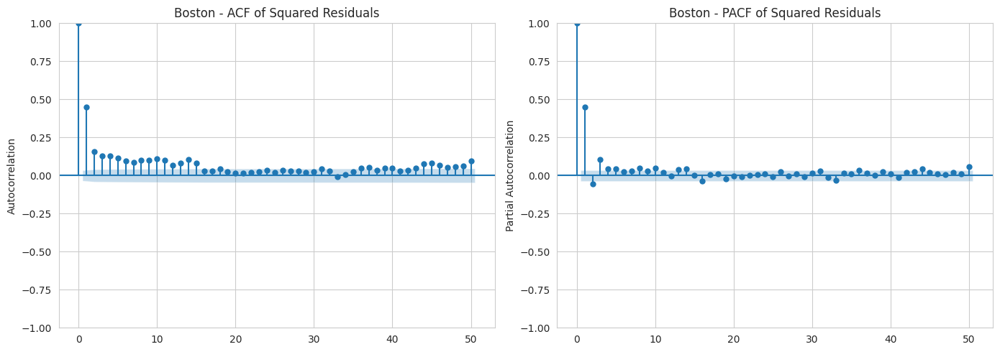

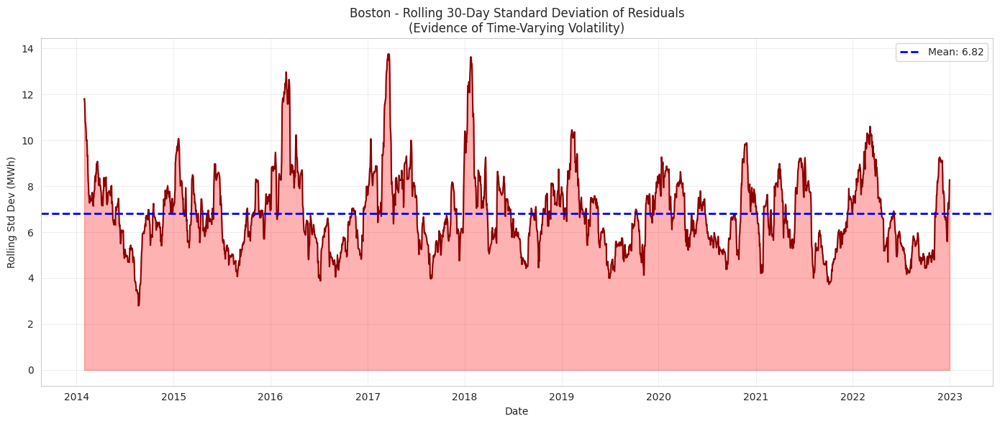

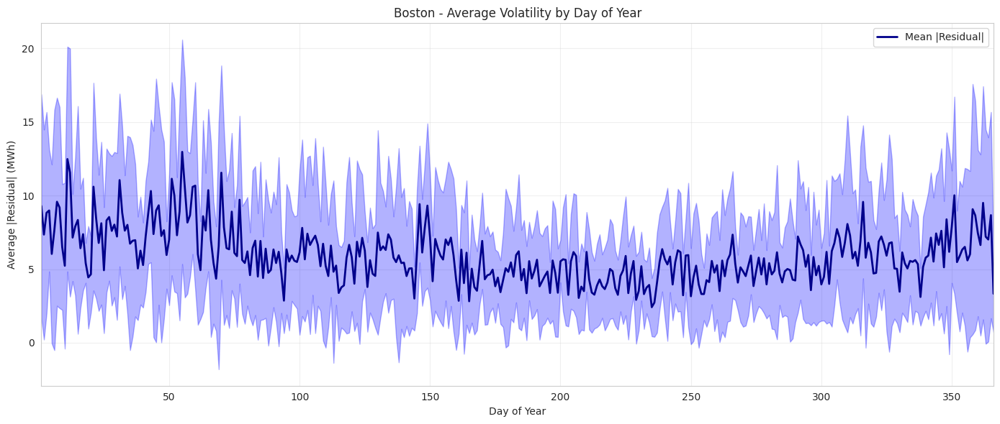


VOLATILITY CLUSTERING SUMMARY
Significant lags in Ljung-Box test: 20/20
See detailed test results above for ARCH LM test and other diagnostics


In [15]:
# Comprehensive volatility clustering analysis using helper function
# This runs ALL 6 volatility clustering tests and visualizations for Boston
volatility_results = analyze_volatility_clustering(
    region_fit['Boston'],
    'Boston',
    save_dir='../data/images'
)
plt.show()

print("\n" + "="*80)
print("VOLATILITY CLUSTERING SUMMARY")
print("="*80)
print(f"Significant lags in Ljung-Box test: {volatility_results['significant_lags']}/20")
print("See detailed test results above for ARCH LM test and other diagnostics")
print("="*80)

## Day of Year Binned Analysis

Average temperature by day of year across all years

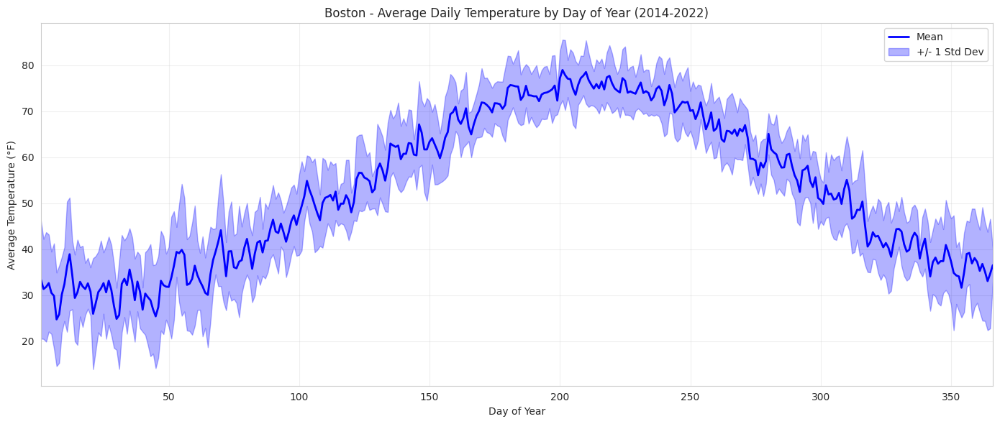

In [16]:
# Calculate average temperature by day of year
boston_avg_by_doy = df_boston['tavg'].groupby(df_boston.index.day_of_year).mean()
boston_std_by_doy = df_boston['tavg'].groupby(df_boston.index.day_of_year).std()

fig, ax = plt.subplots(figsize=(14, 6))

ax.plot(boston_avg_by_doy.index, boston_avg_by_doy.values, color='blue', lw=2, label='Mean')
ax.fill_between(
    boston_avg_by_doy.index,
    boston_avg_by_doy.values - boston_std_by_doy.values,
    boston_avg_by_doy.values + boston_std_by_doy.values,
    alpha=0.3,
    color='blue',
    label='+/- 1 Std Dev'
)

ax.set_xlabel('Day of Year')
ax.set_ylabel('Average Temperature (°F)')
ax.set_title('Boston - Average Daily Temperature by Day of Year (2014-2022)')
ax.legend()
ax.grid(True, alpha=0.3)
ax.set_xlim(1, 366)

plt.tight_layout()
plt.savefig('../data/images/temp_boston_average_by_doy.png', dpi=150, bbox_inches='tight')
plt.show()

## Summary Statistics by Region

In [17]:
# Summary table for all regions
summary_data = []

for region_name, df_region in regions_data.items():
    summary_data.append({
        'Region': region_name,
        'Mean Avg Temp': df_region['tavg'].mean(),
        'Std Avg Temp': df_region['tavg'].std(),
        'Min Temp': df_region['tmin'].min(),
        'Max Temp': df_region['tmax'].max(),
        'Avg Range': (df_region['tmax'] - df_region['tmin']).mean(),
        'Annual Variation': df_region['tavg'].max() - df_region['tavg'].min(),
    })

summary_stats = pd.DataFrame(summary_data)

print("\nTemperature Summary Statistics by Region (°F):")
print("=" * 100)
print(summary_stats.to_string(index=False))
print("=" * 100)

# Save to CSV
summary_stats.to_csv('../data/processed/temperature_summary.csv', index=False)
print("\n✓ Summary statistics saved to '../data/processed/temperature_summary.csv'")


Temperature Summary Statistics by Region (°F):
     Region  Mean Avg Temp  Std Avg Temp  Min Temp  Max Temp  Avg Range  Annual Variation
     Boston      53.030119     17.520621      -9.0     100.0  15.077578              89.0
   New York      57.261789     17.616986       1.0     101.0  13.710678              82.5
    Chicago      51.323243     20.251983     -23.0      99.0  16.955583             103.5
Minneapolis      47.313964     23.043946     -28.0     101.0  16.910861             110.5
    Houston      70.976270     13.271352      13.0     106.0  19.669608              73.0
     Dallas      67.702616     16.068564      -2.0     109.0  20.428050              89.5

✓ Summary statistics saved to '../data/processed/temperature_summary.csv'


## GARCH Model for Residual Volatility

Model the time-varying volatility in residuals using GARCH (Generalized Autoregressive Conditional Heteroskedasticity)

In [18]:
# Fit the combined seasonal + GARCH model to Boston data
boston_garch_fit = fit_seasonal_garch_model(df_boston['tavg'], n_harmonics=3)

print("=" * 80)
print("SEASONAL MODEL (Mean)")
print("=" * 80)
print(f"Model R²: {1 - np.var(boston_garch_fit['residuals']) / np.var(boston_garch_fit['y']):.4f}")
print(f"Residuals mean: {boston_garch_fit['residuals'].mean():.4f} °F")
print(f"Residuals std: {boston_garch_fit['residuals'].std():.2f} °F")

print("\n" + "=" * 80)
print("GARCH(1,1) MODEL (Volatility)")
print("=" * 80)
garch = boston_garch_fit['garch_params']
print(f"ω (omega):     {garch['omega']:.6f}")
print(f"α (alpha):     {garch['alphas'][0]:.6f}")
print(f"β (beta):      {garch['betas'][0]:.6f}")
print(f"Persistence (α+β): {boston_garch_fit['persistence']:.6f}")
print(f"\nAverage volatility: {boston_garch_fit['volatility'].mean():.2f} °F")
print(f"Volatility range: [{boston_garch_fit['volatility'].min():.2f}, {boston_garch_fit['volatility'].max():.2f}] °F")

print("\n" + "=" * 80)
print("INTERPRETATION")
print("=" * 80)
if boston_garch_fit['persistence'] > 0.9:
    print("⚠️  High persistence (α+β > 0.9): Volatility shocks are very persistent")
elif boston_garch_fit['persistence'] > 0.7:
    print("⚠️  Moderate persistence: Volatility shocks decay moderately")
else:
    print("✓ Low persistence: Volatility shocks decay quickly")

/usr/local/python/3.12.1/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/python/3.12.1/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)


/workspaces/Financial-Engineering-Project/notebooks/seasonal_models.py:167: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'constant': armax_result.params[0],


SEASONAL MODEL (Mean)
Model R²: 0.8893
Residuals mean: 0.0068 °F
Residuals std: 5.83 °F

GARCH(1,1) MODEL (Volatility)
ω (omega):     0.174760
α (alpha):     0.170302
β (beta):      0.829675
Persistence (α+β): 0.999977

Average volatility: 5.67 °F
Volatility range: [2.50, 18.95] °F

INTERPRETATION
⚠️  High persistence (α+β > 0.9): Volatility shocks are very persistent


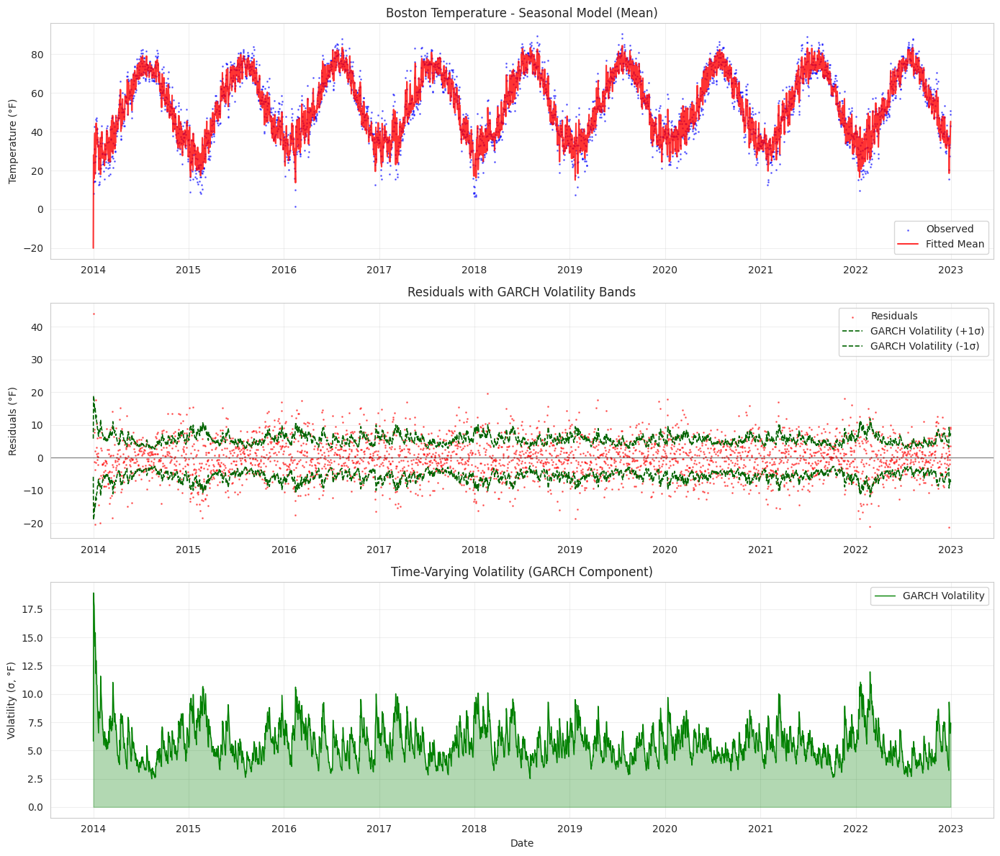


Residuals within ±1σ band: 66.7%
Residuals within ±2σ band: 94.0%
Expected (normal distribution): 68.3% within ±1σ, 95.4% within ±2σ


In [19]:
# Visualize the complete model: Mean + Volatility bands
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(14, 12))

# Panel 1: Observed vs Fitted Mean
axes[0].scatter(boston_garch_fit['index'], boston_garch_fit['y'], s=1, alpha=0.5, 
                color='blue', label='Observed')
axes[0].plot(boston_garch_fit['index'], boston_garch_fit['y_pred'], 
             color='red', lw=1.5, label='Fitted Mean', alpha=0.8)
axes[0].set_ylabel('Temperature (°F)')
axes[0].set_title('Boston Temperature - Seasonal Model (Mean)')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Panel 2: Residuals with GARCH volatility bands
axes[1].scatter(boston_garch_fit['index'], boston_garch_fit['residuals'], 
                s=1, alpha=0.5, color='red', label='Residuals')
axes[1].plot(boston_garch_fit['index'], boston_garch_fit['volatility'], 
             color='darkgreen', lw=1.2, linestyle='--', label='GARCH Volatility (+1σ)')
axes[1].plot(boston_garch_fit['index'], -boston_garch_fit['volatility'], 
             color='darkgreen', lw=1.2, linestyle='--', label='GARCH Volatility (-1σ)')
axes[1].axhline(0, color='black', linestyle='-', lw=0.8, alpha=0.5)
axes[1].set_ylabel('Residuals (°F)')
axes[1].set_title('Residuals with GARCH Volatility Bands')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

# Panel 3: Time-varying volatility
axes[2].plot(boston_garch_fit['index'], boston_garch_fit['volatility'], 
             color='green', lw=1.0, label='GARCH Volatility')
axes[2].fill_between(boston_garch_fit['index'], 0, boston_garch_fit['volatility'], 
                      alpha=0.3, color='green')
axes[2].set_xlabel('Date')
axes[2].set_ylabel('Volatility (σ, °F)')
axes[2].set_title('Time-Varying Volatility (GARCH Component)')
axes[2].legend()
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('../data/images/temp_boston_seasonal_garch_model.png', dpi=150, bbox_inches='tight')
plt.show()

# Calculate percentage of residuals within volatility bands
within_1sigma = np.abs(boston_garch_fit['residuals']) <= boston_garch_fit['volatility']
within_2sigma = np.abs(boston_garch_fit['residuals']) <= 2 * boston_garch_fit['volatility']

print(f"\nResiduals within ±1σ band: {within_1sigma.sum() / len(within_1sigma) * 100:.1f}%")
print(f"Residuals within ±2σ band: {within_2sigma.sum() / len(within_2sigma) * 100:.1f}%")
print(f"Expected (normal distribution): 68.3% within ±1σ, 95.4% within ±2σ")

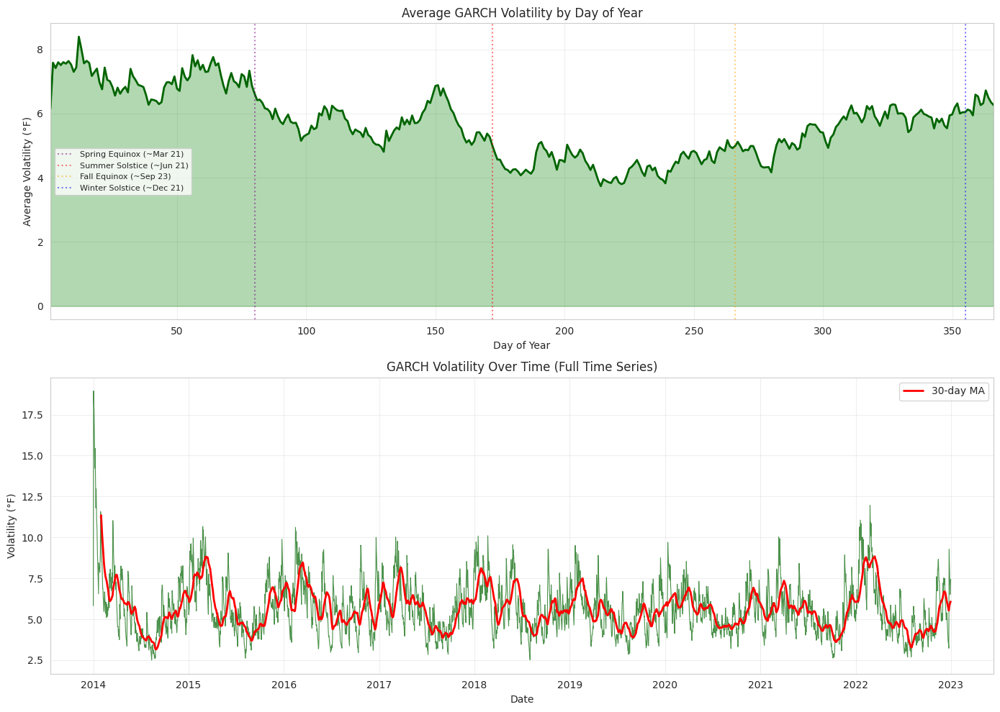


Most volatile days of year (top 10):
date
12    8.396267
13    8.006669
56    7.823474
64    7.762117
58    7.662610
15    7.645022
8     7.638590
6     7.602458
4     7.600042
2     7.585799
dtype: float64

Least volatile days of year (bottom 10):
date
214    3.736369
222    3.799246
239    3.825595
223    3.835284
218    3.836560
221    3.853118
217    3.858993
216    3.904685
213    3.919043
238    3.934137
dtype: float64


In [20]:
# Compare volatility patterns by season
volatility_by_doy = pd.Series(
    boston_garch_fit['volatility'], 
    index=boston_garch_fit['index']
).groupby(lambda x: x.day_of_year).mean()

fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(14, 10))

# Volatility by day of year
axes[0].plot(volatility_by_doy.index, volatility_by_doy.values, 
             color='darkgreen', lw=2)
axes[0].fill_between(volatility_by_doy.index, 0, volatility_by_doy.values, 
                      alpha=0.3, color='green')
axes[0].set_xlabel('Day of Year')
axes[0].set_ylabel('Average Volatility (°F)')
axes[0].set_title('Average GARCH Volatility by Day of Year')
axes[0].grid(True, alpha=0.3)
axes[0].set_xlim(1, 366)

# Mark seasons
axes[0].axvline(80, color='purple', linestyle=':', alpha=0.5, label='Spring Equinox (~Mar 21)')
axes[0].axvline(172, color='red', linestyle=':', alpha=0.5, label='Summer Solstice (~Jun 21)')
axes[0].axvline(266, color='orange', linestyle=':', alpha=0.5, label='Fall Equinox (~Sep 23)')
axes[0].axvline(355, color='blue', linestyle=':', alpha=0.5, label='Winter Solstice (~Dec 21)')
axes[0].legend(fontsize=8)

# Volatility over time (full time series)
axes[1].plot(boston_garch_fit['index'], boston_garch_fit['volatility'], 
             color='darkgreen', lw=0.8, alpha=0.7)
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Volatility (°F)')
axes[1].set_title('GARCH Volatility Over Time (Full Time Series)')
axes[1].grid(True, alpha=0.3)

# Add 30-day moving average
rolling_vol = pd.Series(
    boston_garch_fit['volatility'], 
    index=boston_garch_fit['index']
).rolling(30).mean()
axes[1].plot(rolling_vol.index, rolling_vol.values, 
             color='red', lw=2, label='30-day MA')
axes[1].legend()

plt.tight_layout()
plt.savefig('../data/images/temp_boston_volatility_patterns.png', dpi=150, bbox_inches='tight')
plt.show()

# Find most/least volatile periods
print("\nMost volatile days of year (top 10):")
print(volatility_by_doy.nlargest(10))
print("\nLeast volatile days of year (bottom 10):")
print(volatility_by_doy.nsmallest(10))

## Apply Seasonal + GARCH Model to All Regions

Fit the combined model to all regions and compare volatility characteristics

In [21]:
# Fit seasonal + GARCH models to all regions and compare using AIC/BIC
regions_dict = {
    'Boston': df_boston['tavg'],
    'NewYork': df_ny['tavg'],
    'Chicago': df_chicago['tavg'],
    'Minneapolis': df_minneapolis['tavg'],
    'Houston': df_houston['tavg'],
    'Dallas': df_dallas['tavg'],
}

print("Fitting models for all regions...")
print("This may take a few minutes...\n")

# # Fit models with 3 and 6 harmonics for all regions
# all_regions_comparison = fit_all_regions(
#     regions_dict, 
#     harmonics_list=[3, 6],
#     ar_order_list=[0, 1, 2, 3],
#     ma_order_list=[0, 1, 2, 3],
#     garch_p_list=[1, 2, 3],
#     garch_q_list=[1, 2, 3]
# )

# print("\n" + "=" * 100)
# print("MODEL COMPARISON - ALL REGIONS (Different ARMA & GARCH Specifications)")
# print("=" * 100)
# print(all_regions_comparison.to_string(index=False))

# print("\n" + "=" * 100)
# print("BEST MODELS BY REGION")
# print("=" * 100)

# # For each region, determine the best model by AIC and BIC
# for region in regions_dict.keys():
#     region_data = all_regions_comparison[all_regions_comparison['Region'] == region]
#     best_aic = region_data.loc[region_data['AIC'].idxmin(), 'Model']
#     best_bic = region_data.loc[region_data['BIC'].idxmin(), 'Model']
    
#     print(f"{region:<15} | Best by AIC: {best_aic:<35} | Best by BIC: {best_bic:<35}")

# print("=" * 100)

# # Save results to CSV
# output_path = '../data/processed/temperature_model_comparison.csv'
# all_regions_comparison.to_csv(output_path, index=False)
# print(f"\n✓ Results saved to: {output_path}")

Fitting models for all regions...
This may take a few minutes...



## AIC/BIC Comparison Across All Regions

Bar chart comparison of model selection criteria

## Build Residuals DataFrame for All Regions

In [22]:
# Fit seasonal models for all regions with 6 harmonics
df_data = {
    'Boston': df_boston,
    'NewYork': df_ny,
    'Chicago': df_chicago,
    'Minneapolis': df_minneapolis,
    'Houston': df_houston,
    'Dallas': df_dallas,
}

df_result = {}
for region, df in df_data.items():
    
    if region == 'Minneapolis':
        df_result[region] = fit_seasonal_garch_model(df['tavg'], n_harmonics=3, ar_order=1, ma_order=2, garch_p=1, garch_q=3)
    if region == 'Chicago':
        df_result[region] = fit_seasonal_garch_model(df['tavg'], n_harmonics=3, ar_order=1, ma_order=2, garch_p=1, garch_q=3)
    if region == 'Boston':
        df_result[region] = fit_seasonal_garch_model(df['tavg'], n_harmonics=3, ar_order=3, ma_order=0, garch_p=1, garch_q=3)
    if region == 'NewYork':
        df_result[region] = fit_seasonal_garch_model(df['tavg'], n_harmonics=3, ar_order=3, ma_order=0, garch_p=1, garch_q=3)
    
    if region == 'Houston':
        df_result[region] = fit_seasonal_garch_model(df['tavg'], n_harmonics=3, ar_order=1, ma_order=1, garch_p=1, garch_q=2)
    if region == 'Dallas':
        df_result[region] = fit_seasonal_garch_model(df['tavg'], n_harmonics=3, ar_order=1, ma_order=1, garch_p=1, garch_q=2)
   
    print(f"{region} - R²: {df_result[region]['r_squared']:.4f}")

# Build a DataFrame of residuals, aligned by date
df_res = pd.DataFrame({
    station: pd.Series(df_result[station]["residuals"], index=df_result[station]["index"])
    for station in SET_TARGET_US_CITIES
})

# Drop rows with any missing values to ensure alignment
df_res = df_res.dropna()
print(f"\nResiduals DataFrame shape: {df_res.shape}")
print(f"Date range: {df_res.index.min()} to {df_res.index.max()}")

/usr/local/python/3.12.1/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/python/3.12.1/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/workspaces/Financial-Engineering-Project/notebooks/seasonal_models.py:167: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'constant': armax_result.params[0],


Boston - R²: 0.8922


/usr/local/python/3.12.1/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/python/3.12.1/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/workspaces/Financial-Engineering-Project/notebooks/seasonal_models.py:167: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'constant': armax_result.params[0],


NewYork - R²: 0.9082


/usr/local/python/3.12.1/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/python/3.12.1/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/workspaces/Financial-Engineering-Project/notebooks/seasonal_models.py:167: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'constant': armax_result.params[0],


Chicago - R²: 0.9153


/usr/local/python/3.12.1/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/python/3.12.1/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/workspaces/Financial-Engineering-Project/notebooks/seasonal_models.py:167: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'constant': armax_result.params[0],


Minneapolis - R²: 0.9329


/usr/local/python/3.12.1/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/python/3.12.1/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/python/3.12.1/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/workspaces/Financial-Engineering-Project/notebooks/seasonal_models.py:167: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'constant': armax_resu

Houston - R²: 0.8635


/usr/local/python/3.12.1/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/usr/local/python/3.12.1/lib/python3.12/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/workspaces/Financial-Engineering-Project/notebooks/seasonal_models.py:167: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  'constant': armax_result.params[0],


Dallas - R²: 0.8843

Residuals DataFrame shape: (3287, 4)
Date range: 2014-01-01 00:00:00 to 2022-12-31 00:00:00


## Pairwise Correlation Analysis

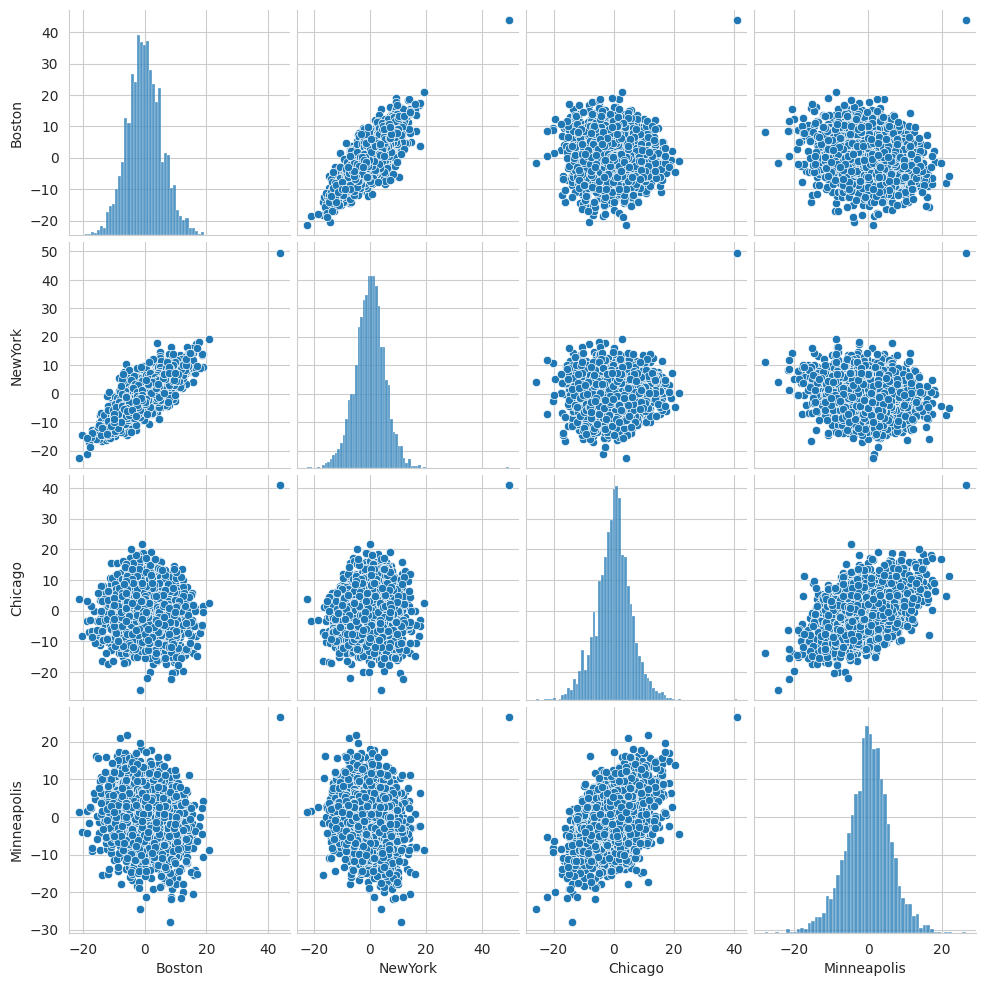

In [23]:
sns.pairplot(df_res)
plt.savefig('../data/images/temp_residuals_pairplot.png', dpi=150, bbox_inches='tight')
plt.show()

## Kendall's Tau Correlation Heatmap

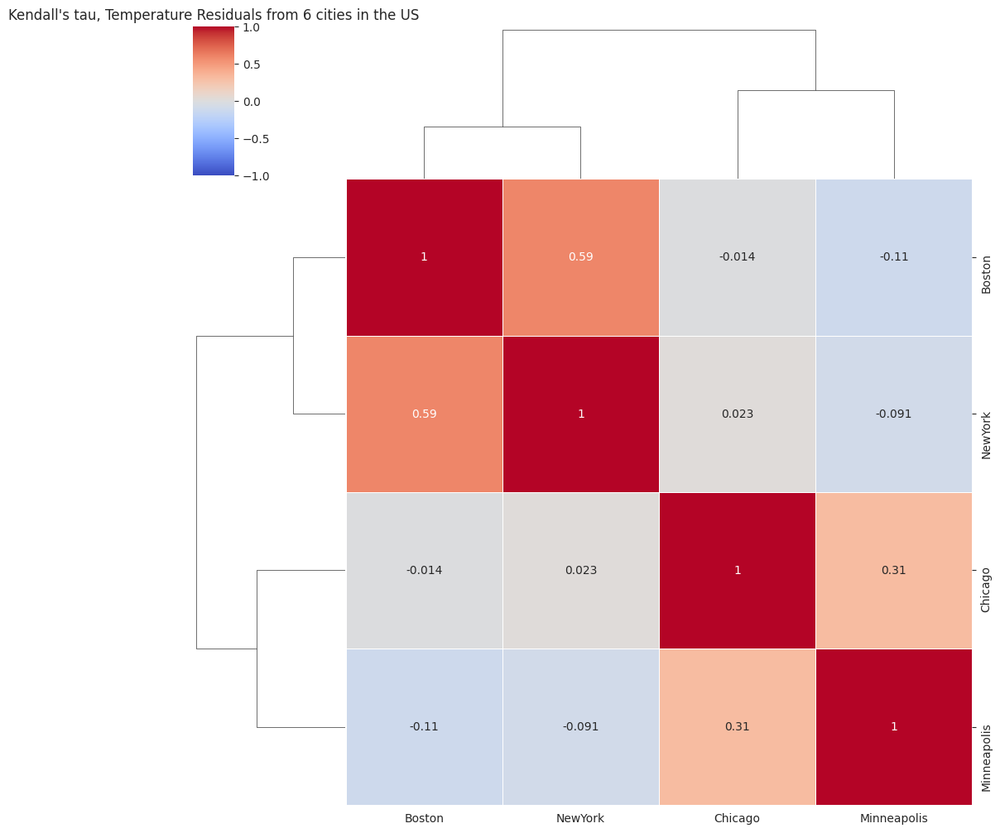

In [24]:
sns.clustermap(
    df_res.corr(method="kendall"),
    annot=True,
    cmap="coolwarm",
    linewidths=0.5,
    vmin=-1,
    vmax=1,
)
plt.title("Kendall's tau, Temperature Residuals from 6 cities in the US")
plt.savefig('../data/images/temp_kendall_tau_full.png', dpi=150, bbox_inches='tight')
plt.show()

## Seasonal Correlation Analysis - CDD and HDD

Split residuals by cooling degree days (CDD) and heating degree days (HDD) months

In [25]:
df_cdd_temp_res = df_res[df_res.index.month.isin(MONTH_CDD)]
df_hdd_temp_res = df_res[df_res.index.month.isin(MONTH_HDD)]

print(f"CDD residuals shape: {df_cdd_temp_res.shape}")
print(f"HDD residuals shape: {df_hdd_temp_res.shape}")

CDD residuals shape: (1377, 4)
HDD residuals shape: (1361, 4)


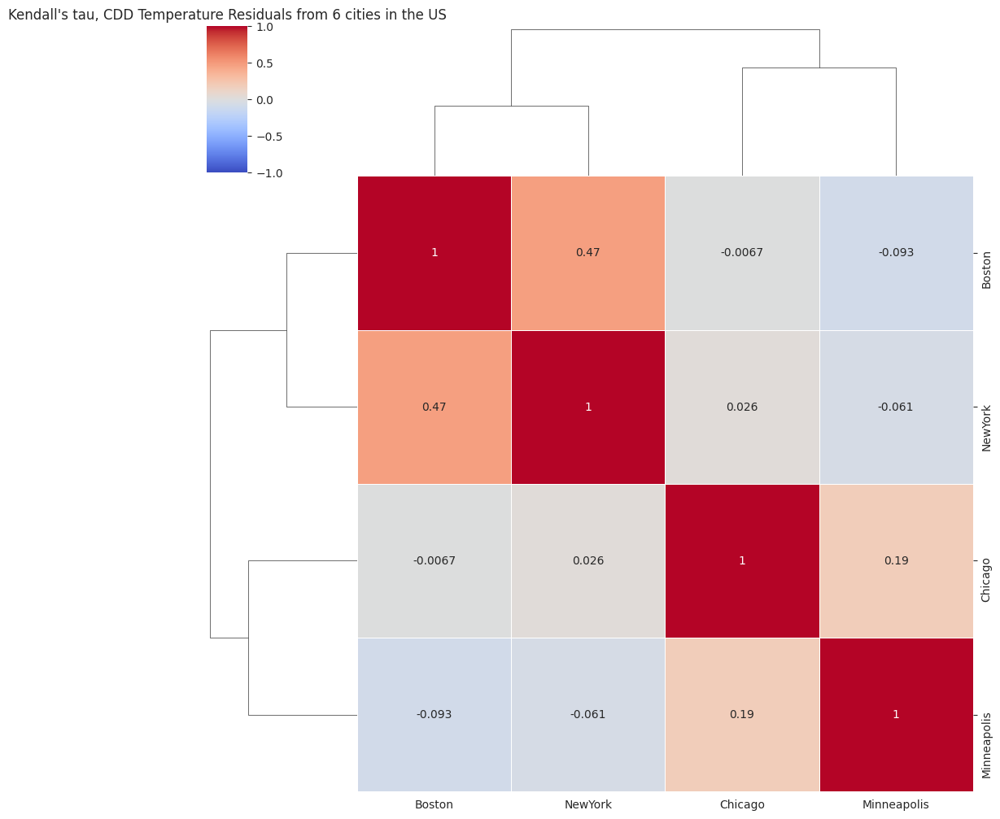

In [26]:
sns.clustermap(
    df_cdd_temp_res.corr(method="kendall"),
    annot=True,
    cmap="coolwarm",
    linewidths=0.5,
    vmin=-1,
    vmax=1,
)
plt.title("Kendall's tau, CDD Temperature Residuals from 6 cities in the US")
plt.savefig('../data/images/temp_kendall_tau_cdd.png', dpi=150, bbox_inches='tight')
plt.show()

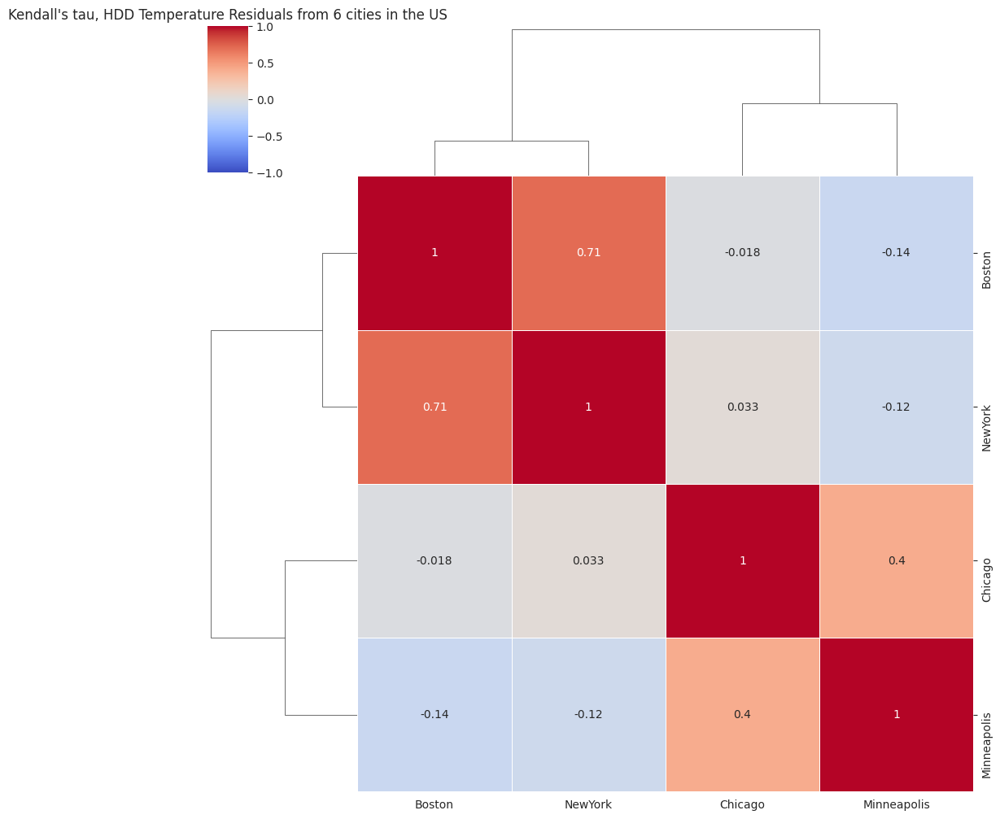

In [27]:
sns.clustermap(
    df_hdd_temp_res.corr(method="kendall"),
    annot=True,
    cmap="coolwarm",
    linewidths=0.5,
    vmin=-1,
    vmax=1,
)
plt.title("Kendall's tau, HDD Temperature Residuals from 6 cities in the US")
plt.savefig('../data/images/temp_kendall_tau_hdd.png', dpi=150, bbox_inches='tight')
plt.show()

## Extreme Value Index (EVI) Analysis

Estimate tail behavior using multiple EVI estimators

In [28]:
# Ensure torch is available
import torch

dct_evi_temp_res_right = {}
for station in SET_TARGET_US_CITIES:
    tmp_vec = df_res[station].values
    # Right tail (positive residuals)
    tmp_vec = tmp_vec[tmp_vec > 0]
    dct_evi_temp_res_right[station] = {
        "hill": unibm.benchmark.est_extreme_value_index_hill(torch.tensor(tmp_vec)),
        "schultze_steinebach": unibm.benchmark.est_extreme_value_index_schultze_steinebach(
            torch.tensor(tmp_vec)
        ),
        "smith": unibm.benchmark.est_extreme_value_index_smith(torch.tensor(tmp_vec)),
        "meerschaert_scheffler": unibm.benchmark.est_extreme_value_index_meerschaert_scheffler(
            torch.tensor(tmp_vec)
        ),
        "genextreme": genextreme.fit(tmp_vec, floc=0)[0].item(),
        "genpareto": genpareto.fit(tmp_vec, floc=0)[0].item(),
        "pareto": pareto.fit(tmp_vec, floc=0)[0].item(),
        "mpmr_wls": unibm.est_extreme_value_index(tmp_vec, is_frechet=False)[
            "slope_emr"
        ],
    }
    
dct_evi_temp_res_left = {}
for station in SET_TARGET_US_CITIES:
    temp_vec = df_res[station].values
    # Left tail (negative residuals)
    temp_vec = -temp_vec[temp_vec < 0]
    dct_evi_temp_res_left[station] = {
        "hill": unibm.benchmark.est_extreme_value_index_hill(torch.tensor(temp_vec)),
        "schultze_steinebach": unibm.benchmark.est_extreme_value_index_schultze_steinebach(
            torch.tensor(temp_vec)
        ),
        "smith": unibm.benchmark.est_extreme_value_index_smith(torch.tensor(temp_vec)),
        "meerschaert_scheffler": unibm.benchmark.est_extreme_value_index_meerschaert_scheffler(
            torch.tensor(temp_vec)
        ),
        "genextreme": genextreme.fit(temp_vec, floc=0)[0].item(),
        "genpareto": genpareto.fit(temp_vec, floc=0)[0].item(),
        "pareto": pareto.fit(temp_vec, floc=0)[0].item(),
        "mpmr_wls": unibm.est_extreme_value_index(temp_vec, is_frechet=False)[
            "slope_emr"
        ],
    }

print("✓ EVI estimation complete for all regions")

✓ EVI estimation complete for all regions


In [29]:
df_evi_res_right = pd.DataFrame(dct_evi_temp_res_right).head(7)
df_evi_res_right[df_evi_res_right < 0] = np.abs(df_evi_res_right[df_evi_res_right < 0])
df_evi_res_right[np.isinf(df_evi_res_right)] = np.nan
display(df_evi_res_right)
print("\nMedian EVI by region (right tail):")
print(df_evi_res_right.median(axis=0))

,Boston,NewYork,Chicago,Minneapolis
hill,0.369510,3.824455,0.745683,0.860272
schultze_steinebach,0.213740,0.203990,0.221557,0.269106
smith,0.197521,0.202594,0.208194,0.185250
meerschaert_scheffler,0.679563,0.662892,0.677583,0.671687
genextreme,0.047915,0.027807,0.010932,0.077396
genpareto,0.093187,0.063349,0.084960,0.173063
pareto,0.123540,0.116500,0.126129,0.156644



Median EVI by region (right tail):
Boston         0.197521
NewYork        0.202594
Chicago        0.208194
Minneapolis    0.185250
dtype: float64


In [30]:
df_evi_res_left = pd.DataFrame(dct_evi_temp_res_left).head(7)
df_evi_res_left[df_evi_res_left < 0] = np.abs(df_evi_res_left[df_evi_res_left < 0])
df_evi_res_left[np.isinf(df_evi_res_left)] = np.nan
display(df_evi_res_left)
print("\nMedian EVI by region (left tail):")
print(df_evi_res_left.median(axis=0))

,Boston,NewYork,Chicago,Minneapolis
hill,0.631482,1.019919,2.051775,0.480943
schultze_steinebach,0.231370,0.217201,0.276948,0.265019
smith,0.185362,0.185455,0.180241,0.203725
meerschaert_scheffler,0.665493,0.664993,0.684907,0.690219
genextreme,0.120377,0.101476,0.064908,0.039130
genpareto,0.226775,0.204416,0.183844,0.159613
pareto,0.150055,0.167083,0.178229,0.147934



Median EVI by region (left tail):
Boston         0.226775
NewYork        0.204416
Chicago        0.183844
Minneapolis    0.203725
dtype: float64


## Tail Dependence Coefficient (TDC) Analysis

Measure extreme co-movements between regions using Ferreira's estimator

In [31]:
def ferreira_tail_dep_coeff(x: torch.Tensor, y: torch.Tensor) -> float:
    """Pairwise tail dependence coefficient (λ) estimator, max of rotation 0, 90, 180, 270
    x and y are both of shape (n, 1) inside (0, 1)
    symmetric for (x,y), (y,1-x), (1-x,1-y), (1-y,x), (y,x), (1-x,y), (1-y,1-x), (x,1-y)
    Ferreira, M.S., 2013. Nonparametric estimation of the tail-dependence coefficient;
    """
    x1 = 1 - x
    y1 = 1 - y
    return (
        3
        - (
            1
            - torch.as_tensor(
                [
                    torch.max(x, y).mean(),
                    torch.max(y, x1).mean(),
                    torch.max(x1, y1).mean(),
                    torch.max(y1, x).mean(),
                ]
            )
            .clamp(0.5, 0.6666666666666666)
            .min()
        ).reciprocal()
    ).item()

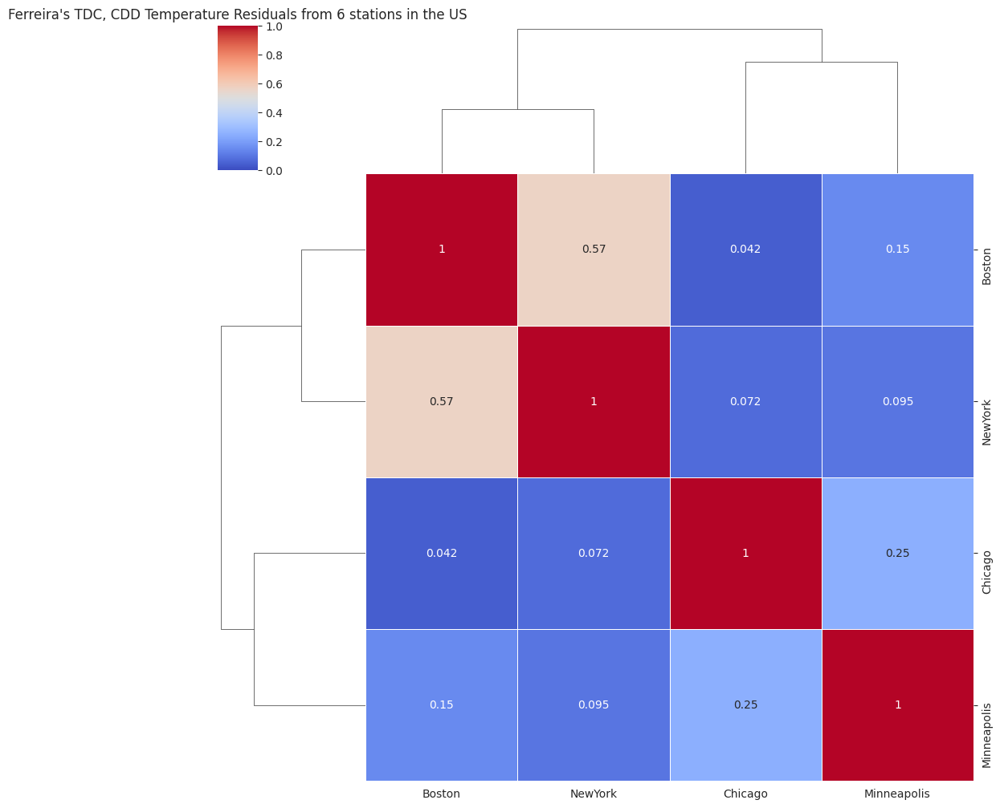

In [32]:
df_cdd_temp_cop = df_cdd_temp_res.apply(lambda vec: unibm.cdf_func_kernel(vec)(vec))
df_tdc_temp_cdd_res = df_cdd_temp_cop.corr(
    method=lambda x, y: ferreira_tail_dep_coeff(torch.tensor(x), torch.tensor(y))
)
g = sns.clustermap(
    df_tdc_temp_cdd_res,
    annot=True,
    cmap="coolwarm",
    linewidths=0.5,
    vmin=0,
    vmax=1,
)
plt.title("Ferreira's TDC, CDD Temperature Residuals from 6 stations in the US")
plt.savefig('../data/images/temp_ferreira_tdc_cdd.png', dpi=150, bbox_inches='tight')
plt.show()

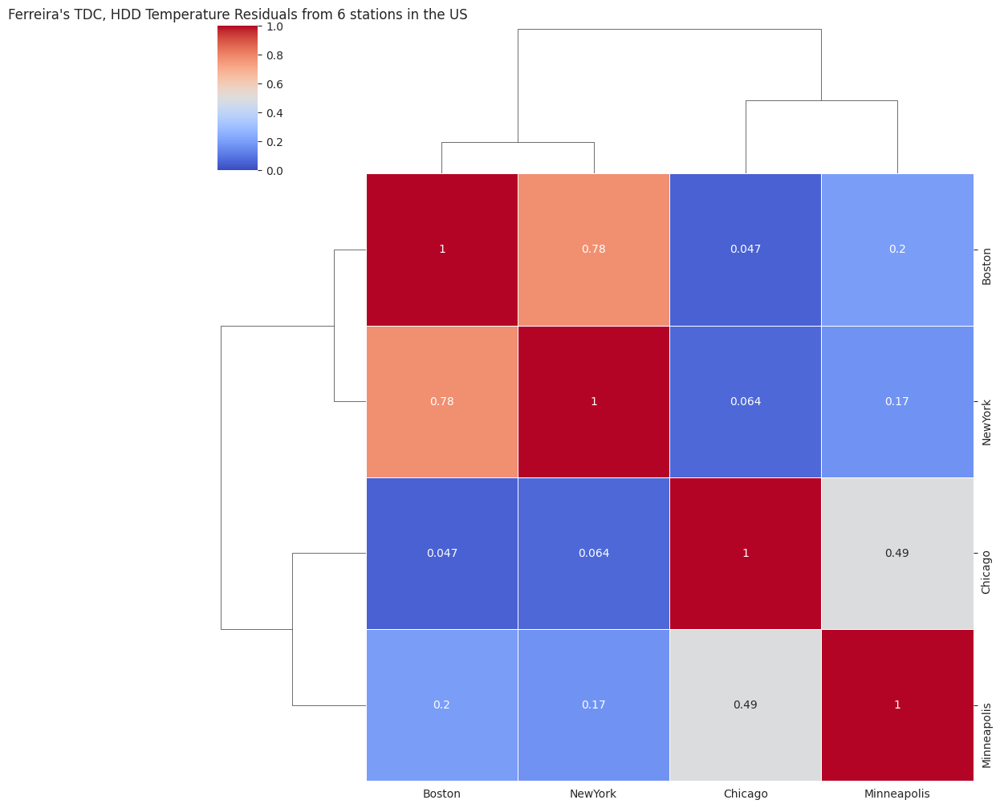

In [33]:
df_hdd_temp_cop = df_hdd_temp_res.apply(lambda vec: unibm.cdf_func_kernel(vec)(vec))
df_tdc_temp_hdd_res = df_hdd_temp_cop.corr(
    method=lambda x, y: ferreira_tail_dep_coeff(torch.tensor(x), torch.tensor(y))
)
g = sns.clustermap(
    df_tdc_temp_hdd_res,
    annot=True,
    cmap="coolwarm",
    linewidths=0.5,
    vmin=0,
    vmax=1,
)
plt.title("Ferreira's TDC, HDD Temperature Residuals from 6 stations in the US")
plt.savefig('../data/images/temp_ferreira_tdc_hdd.png', dpi=150, bbox_inches='tight')
plt.show()

## Save Analysis Results

Save all computed data and results to files

In [34]:
import pickle

# Save EVI results to CSV
df_evi_res_right.to_csv('../data/processed/temperature_evi_right_tail.csv')
df_evi_res_left.to_csv('../data/processed/temperature_evi_left_tail.csv')

# Save TDC results
df_tdc_temp_cdd_res.to_csv('../data/processed/temperature_tdc_cdd.csv')
df_tdc_temp_hdd_res.to_csv('../data/processed/temperature_tdc_hdd.csv')


# Save summary statistics
summary_stats.to_csv('../data/processed/temperature_summary_stats.csv', index=False)

# Save all relevant data to pickle file
with open('../data/processed/temperature_analysis_data.pkl', 'wb') as f:
    pickle.dump({
        'df_boston': df_boston,
        'df_ny': df_ny,
        'df_chicago': df_chicago,
        'df_minneapolis': df_minneapolis,
        'df_houston': df_houston,
        'df_dallas': df_dallas,
        'df_res': df_res,
        'df_cdd_temp_res': df_cdd_temp_res,
        'df_hdd_temp_res': df_hdd_temp_res,
        'df_result': df_result,
        'region_fit': region_fit,
        'df_tdc_temp_cdd_res': df_tdc_temp_cdd_res,
        'df_tdc_temp_hdd_res': df_tdc_temp_hdd_res,
        'dct_evi_temp_res_right': dct_evi_temp_res_right,
        'dct_evi_temp_res_left': dct_evi_temp_res_left,
        'df_evi_res_right': df_evi_res_right,
        'df_evi_res_left': df_evi_res_left,
        'boston_garch_fit': boston_garch_fit,
        'summary_stats': summary_stats,
        'volatility_by_doy': volatility_by_doy,
    }, f)

print("✓ All data saved to '../data/processed/temperature_analysis_data.pkl'")
print("✓ EVI results saved to CSV files")
print("✓ TDC results saved to CSV files")
print("✓ Model comparison results saved to CSV")
print("✓ Summary statistics saved to CSV")

✓ All data saved to '../data/processed/temperature_analysis_data.pkl'
✓ EVI results saved to CSV files
✓ TDC results saved to CSV files
✓ Model comparison results saved to CSV
✓ Summary statistics saved to CSV
